#TEA: ASTROPHYSICS COURSE (2025-2026)

### Photometry


In [1]:
'''#We are going to load the data
from google.colab import drive
#We mount Google Drive so we can read the data
drive.mount('/content/drive')
'''


"#We are going to load the data\nfrom google.colab import drive\n#We mount Google Drive so we can read the data\ndrive.mount('/content/drive')\n"

In [2]:
import astropy
import photutils

print("Astropy:", astropy.__version__)
print("Photutils:", photutils.__version__)

Astropy: 8.0.1
Photutils: 3.0.0


In [3]:
#Now we will install some packages that we are going to need
!pip install photutils


# Astronomical Images

The acquisition and processing of photometric images in astronomy is a crucial process for obtaining precise and reliable scientific results. Images are classified into four fundamental types: electronic polarization images ("bias"), dark current images ("dark"), field-flattening images ("flat"), and science images. The first three are essential for calibrating the science images, as we will see below.

First, we will explain how to open and handle this type of scientific image. These are usually provided in FITS format (Flexible Image Transport System). This format not only contains the matrix of numbers that represents the information captured by the detector, but also includes a "header" that provides crucial information about the system and the acquisition method. The header stores essential metadata, such as the exposure, filters used, astronomical coordinates, and other details related to the observation. The combination of this matrix of numbers and the header in a FITS file allows astronomical data to be stored and shared in a structured and complete way.

The dataset for this tutorial consists of the images taken by master's students at Calar Alto during the 2023/2024 course. To easily run this notebook, you can either download the images and upload them to your drive, or create a shortcut in your Drive to the repository:
https://drive.google.com/drive/folders/1GIYnE6Rzq3pkck4xNTObKzSAKEgshDog?usp=drive_link


In [1]:
from astropy.io import fits #We import the library that contains the functions to handle fits files
# TODO: Set this to the local folder where you downloaded the data
# (see the "Data" section in the README for the Google Drive link)
base = r"D:\Documents\Grado en física\IV\TEA\Proyecto\Datos obtenidos en la UAM\2025-11-06"
#Let's open a science image as an example
science = base+r"\M57_B/19_45_53\M57_B_00001.fits"
hdu = fits.open(science) #We use the fits function to open the data
#To access the data:
data = hdu[0].data
print("Data Shape: ",data.shape)
header = hdu[0].header #We access the header


Data Shape:  (3520, 4656)


In [5]:
#TODO: Write a function that takes a filename as a parameter and returns the image and the header
import numpy as np
def read_data(fname):
  hdu = fits.open(fname)
  data = hdu[0].data
  header = hdu[0].header
  hdu.close()
  return data.astype(np.float64),header

def save_fits(fname, data, header=None,overwrite=True):
  if header is None:
    hdu = fits.PrimaryHDU(data=data)
  else:
    hdu = fits.PrimaryHDU(data=data, header=header)
  hdu.writeto(fname, overwrite=overwrite)
  return None




In principle, a .fits file can contain more than one data table, which we would access with hdu[0], hdu[1], hdu[2]... But in the data obtained both at the UAM Observatory and at Calar Alto, we will only have data in the hdu[0] table.

In the header we have a large amount of information about how the data was taken and the conditions at that time. Although we can read the entire header, we can access specific fields using: hdu[0].header['KEY'].
The fields we will most frequently want to use are the object name ("OBJECT"), exposure time ("EXPTIME"), air mass ("AIRMASS"), image size ("NAXIS1" and "NAXIS2"), and the detector section that was used ("DATASEC")


In [6]:
header

SIMPLE  =                    T / C# FITS: 11/06/2025 19:45:53                   
BITPIX  =                   16                                                  
NAXIS   =                    2 / Dimensionality                                 
NAXIS1  =                 4656                                                  
NAXIS2  =                 3520                                                  
OBJECT  = 'M57_B   '           /                                                
GAIN    =                  550 /                                                
FILTER  = 'Filter 2'           /                                                
DATE-AVG= '2025-11-06T18:45:46.0400132' / System Clock:Est. Frame Mid Point     
DATE-END= '2025-11-06T18:45:53.5400132' / System Clock:Est. Frame End           
DATE-OBS= '2025-11-06T18:45:38.5400132' / System Clock:Est. Frame Start         
SWCREATE= 'SharpCap v4.0.8218.0, 64 bit' /                                      
FRAMETYP= 'Light   '        

In [7]:
#TODO: Print the object name, the exposure time, the air mass, and the size of the
print("Object name :",header['OBJECT'])
print("Exposure time :",header['EXPTIME'],' s')
#print("Air mass :",header['AIRMASS'])
print("Image size (in pixels) :",header['NAXIS1'],' x ', header['NAXIS2'])



Object name : M57_B
Exposure time : 15  s
Image size (in pixels) : 4656  x  3520


And how can we view the data in the image? Basically an astronomical image is an NxN matrix in which we store a measurement of how many photons reached each pixel.

To display the image we simply assign more or less brightness to each pixel depending on how many counts it contains.

Remember that the sensitivity of our eye is logarithmic, so if we assign brightness linearly, we won't be able to distinguish details. To handle this, we can either display the logarithm of the image, or adjust the maximum and minimum values to display.
Here is an example:


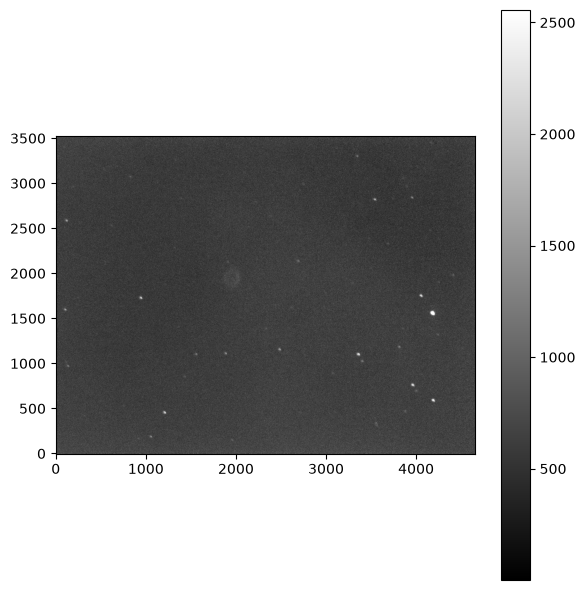

In [8]:
#TODO: Define a function that, given an image (as an NxM matrix), displays it
#on screen using the plt.imshow function, and plot one of the images.
import matplotlib.pyplot as plt

def show_image(data,vmin=None,vmax=None):
  if vmin is None:
    vmin = np.nanpercentile(data,1)
  if vmax is None:
    vmax = np.nanpercentile(data,99)

  plt.figure(figsize=[6,6],dpi=100)
  plt.imshow(data,vmin=vmin,vmax=vmax,origin='lower',
             cmap="gray")
  plt.colorbar()
  plt.tight_layout()
  plt.show()
  return None

show_image(data)



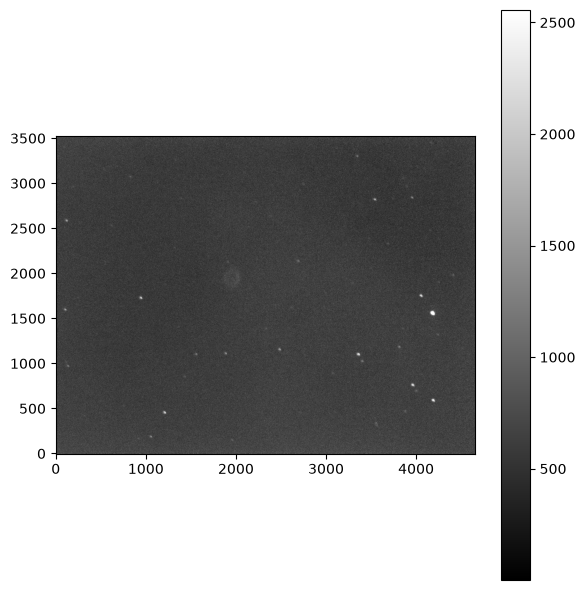

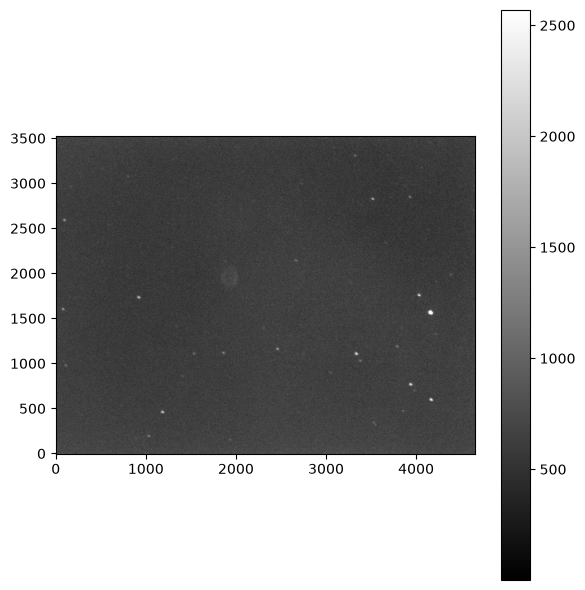

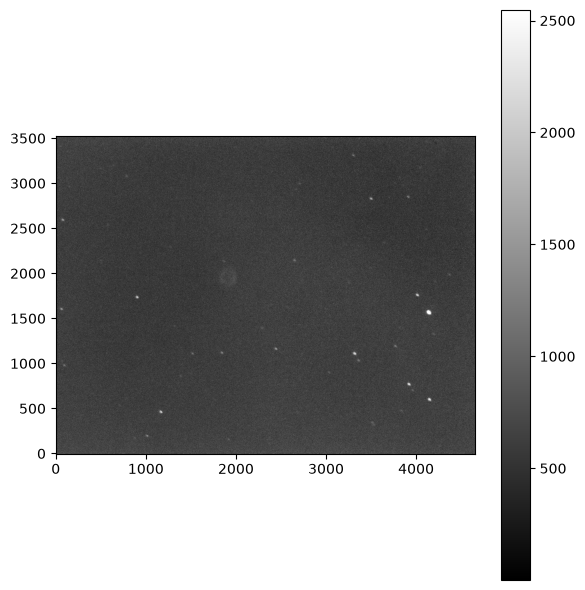

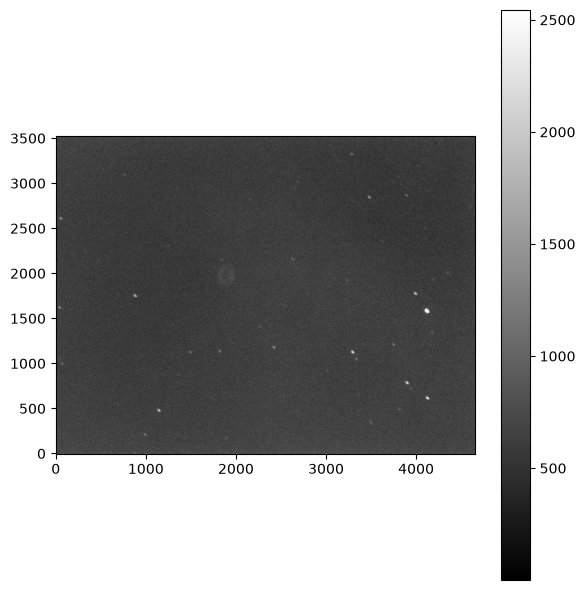

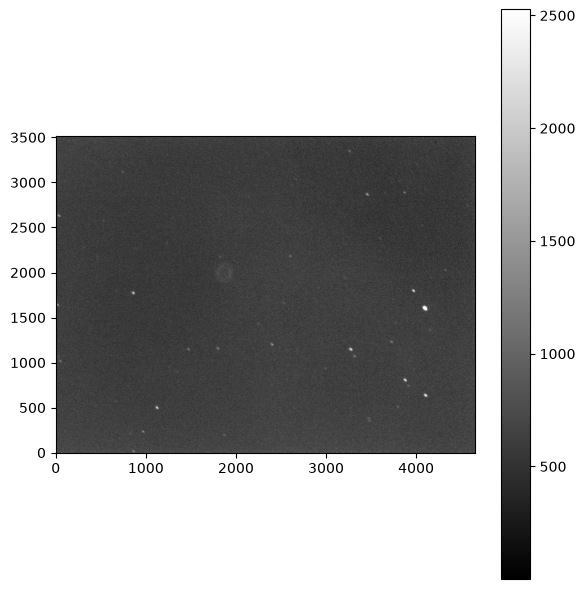

...

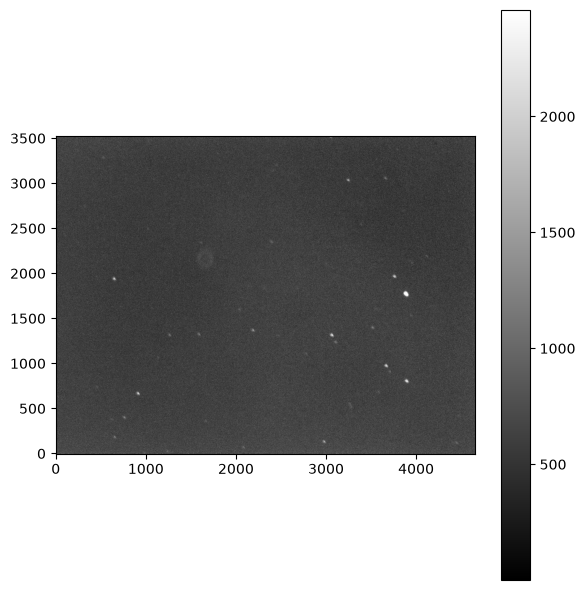

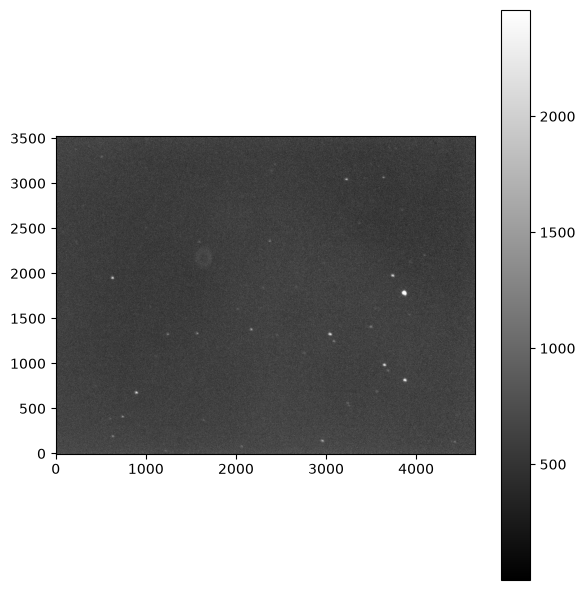

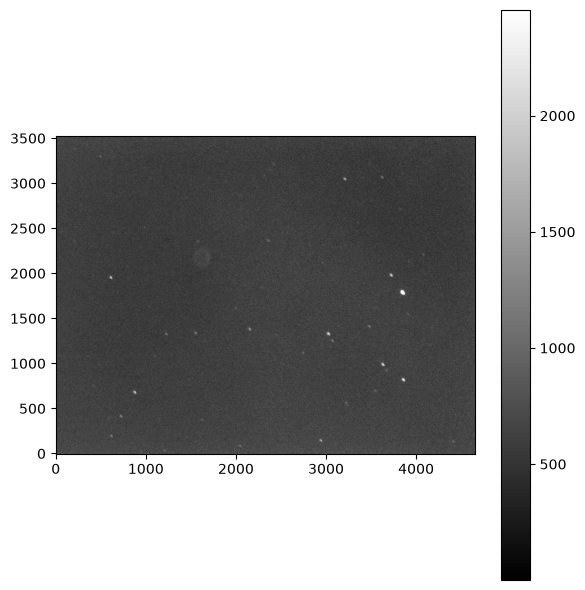

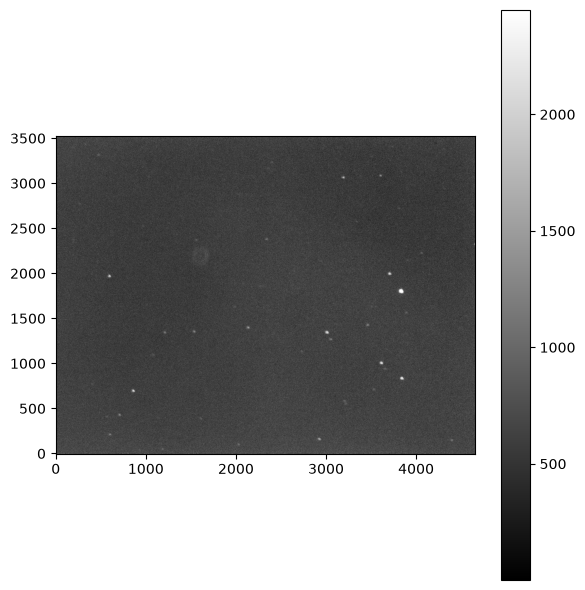

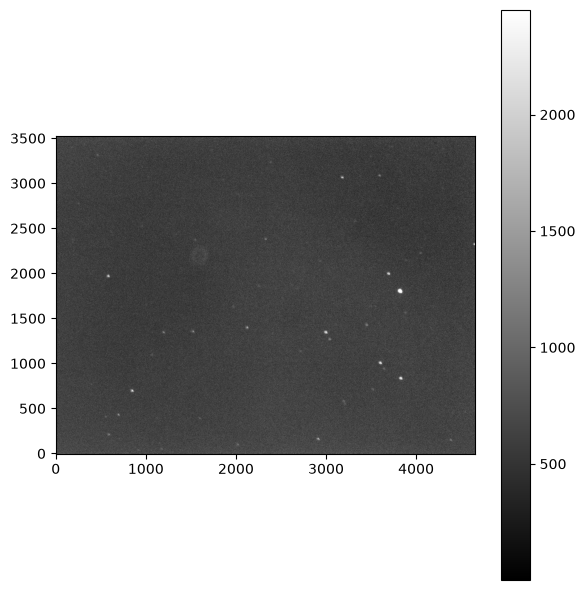

In [9]:
import os
directorio = base+r"\M57_B/19_45_53\\"
for archivo in os.listdir(directorio):
    if archivo.endswith(".fits"):
        ruta = os.path.join(directorio, archivo)
        full_data, _ = read_data(ruta)
        show_image(full_data)
        

Good images


## The "Bias"

To obtain quality scientific data, there are a series of effects that need to be corrected in our science images. For this, a series of calibration images are taken: "bias", "dark" and "flat".

Our detector, the CCD camera, collects the number of photons that reach each pixel. In these small semiconductors, when a photon with the right energy hits, it excites an electron from the valence band to the conduction band. Then, once the exposure is finished, the detector passes the electrons from one row to another until the "edge" of the camera, where the number of electrons is "read". This is done through the Analog-to-Digital Converter (ADC). The conversion factor between electrons and "counts" is called Gain. The number of counts is stored as an integer, frequently 16 bits. So the number of counts can range between 0 and 65,535.

In this process of passing electrons from one column to another, a certain error can occur, which we call "read noise".

Likewise, when measuring pixels where no photon has been received, the ADC can make an error, which can sometimes result in measuring a "negative" current and therefore a negative number of counts. The consequence would be that one of those 16 bits would be needed for the sign, which would effectively lose half of the dynamic range. To avoid this, a certain minimum current level can be set in the ADC so that a minimum number of counts is always measured, such that even taking into account the "read noise", the number of counts is always >0. This is what is called bias current.

This implies that all our images, even those taken in total darkness, will always measure a certain amount of counts. To compensate for these two effects we will measure and use the "bias".

When taking these "bias" frames, we take images with an exposure time texp = 0s, since the only thing we want to evaluate is this minimum polarization current and the pixel read noise. Although one would expect this noise to follow a Poisson distribution, this might not be the case if there were some defect in the detector (for example dead pixels, or differences in pixel polarization that give rise to some structure in the bias)

Here is an example of what a real "bias" looks like.


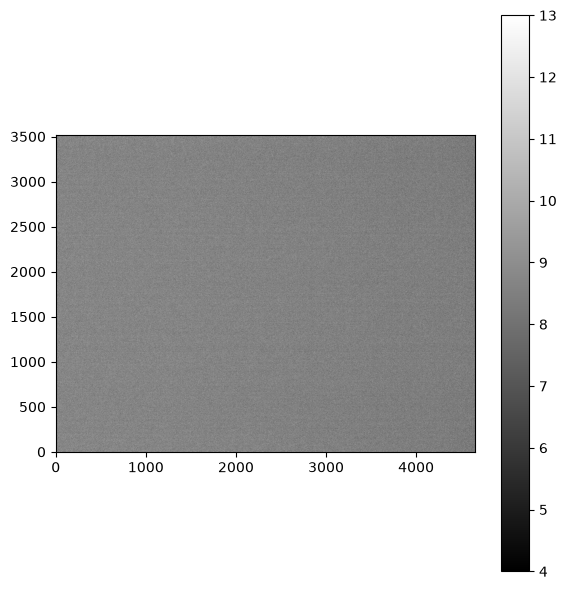

Exposure time :  3.2e-05  s


In [10]:
f_bias = base+r"\bias_good\19_02_54\bias_good_00004.fits" #We set the path to our image
#TODO: Plot a bias image and its exposure time
bias, h_bias = read_data(f_bias)
show_image(bias)
print('Exposure time : ',h_bias['EXPTIME'],' s')



As can be seen in the image, the left column is well below the average level of ~675 counts and the bottom row is well above it.


## Dark Current: "Dark"

However, there are other physical processes besides the photoelectric effect that can contribute to having more electrons in the conduction band of our detector.

Besides cosmic rays that can hit the detector during data acquisition (which we will explain later how to deal with), the effect we will most frequently have to deal with is thermal noise.

Due to the temperature of the detector, electrons can spontaneously jump to the conduction band. This effect causes counts to be measured even when the detector is completely in the dark, hence the name dark current.

This effect is strongly dependent on temperature. In professional observatories, detectors are kept at very low temperatures by cooling them with liquid Nitrogen. In these cases, the dark current is practically zero.
However, with more amateur equipment it is essential to correct for this effect. For this, several images are taken with the shutter completely closed and with an exposure time equivalent to that of the science images.


## Field Flattening: "Flat"

Finally, let's discuss the field-flattening images. Here the idea is to correct for the sensitivity of the different pixels of the camera. It can happen that due to some manufacturing defect, some pixels are more or less efficient at converting photons into electrons.

Likewise, it can happen that the telescope's optical system concentrates more light in the central area of the detector than at the edges if it has a very large physical size, giving rise to the "vignetting" effect.

Finally, it is common that over time small dust particles accumulate both on the optical system (which may be more or less easy to clean) and on the surface of the detector. These elements cast a "shadow" on the detector so that certain pixels receive less light than others. This appears in the image as "donuts" with lower sensitivity.

To correct these effects, images are taken against as uniform a lighting background as possible. The idea is that in such a situation, all pixels should measure the same number of counts. If this is not the case we can correct the sensitivity of each pixel with a multiplicative factor.


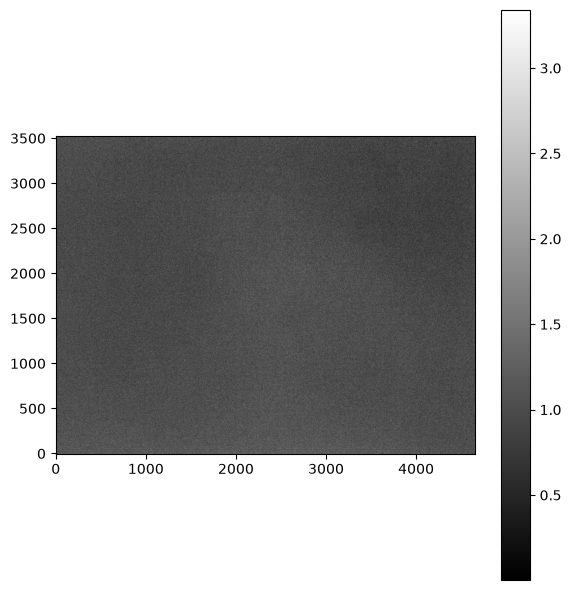

In [11]:
f_flat = base+r"\Flat_B\20_20_40\Flat_B_00001.fits" #We set the path to our image
#TODO: Open a flat image. Normalize it by dividing by the mean and display it
flat, h_flat = read_data(f_flat)
show_image(flat/np.nanmean(flat))


In this example flat, the strong vignetting effect that reduces the image sensitivity at the corners can be seen. This is because the detector size is very large, and the optical system concentrates a greater amount of light on the center of the image.

Also, in the central area those circular "donut"-shaped structures can be seen, which are nothing more than dust specks on the filter that cast a "shadow" on the detector.


## "Science" Image

Finally, the most important image will be that of the object we want to measure. We will call this the science image. We will expose the detector through the telescope to the object we want to study, with the goal of capturing as much light and information as possible.

However, two things should be noted. First, this "raw" image will be affected by all the problems mentioned above: read noise, thermal noise, different sensitivities between pixels, etc.
All of this can be corrected through the calibration images we discussed previously. In addition, the process of capturing photons is Poissonian, so every measurement will be affected by this other noise contribution. We will discuss this later.

Second, the relationship between incident photons and electrons released from the valence band is linear. However, as electrons accumulate in the conduction band of the detector, they exert a screening effect that hinders the jump of new electrons to the conduction band. In this regime, the detector is said to lose its linearity, and therefore it becomes more difficult to extract the relationship between counts and the intrinsic brightness of the object. In the worst case, if too many electrons accumulate in a detector pixel, they can spill over into neighboring pixels. Therefore it is important to keep exposures in the detector's linear regime, or otherwise discard data above this threshold when doing science.


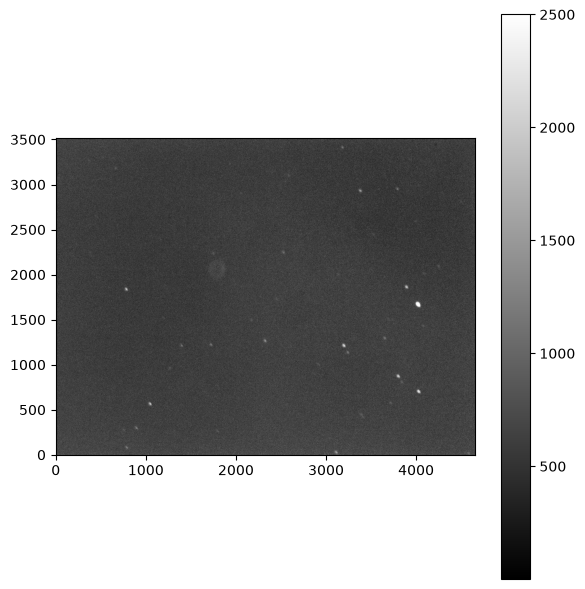

Exposure time :  15  s
Number of saturated pixels :  4656


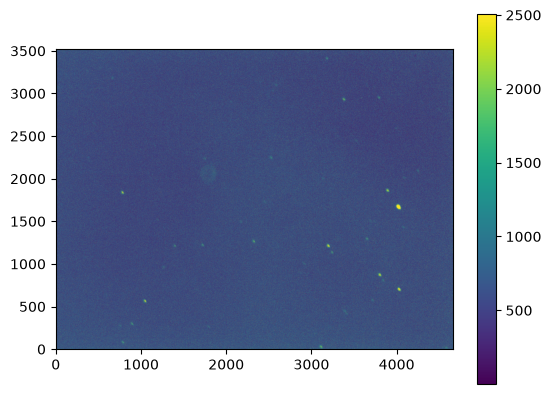

In [12]:
f_ciencia = base+r"\M57_B/19_45_53\M57_B_00009.fits" #We set the path to our image
#TODO: Display one of the science images. How long is the exposure time of
#this image? Are there any saturated pixels?

science, h_science = read_data(f_ciencia)
show_image(science)
print('Exposure time : ',h_science['EXPTIME'],' s')
threshold = 60000
saturated_pixels = science>threshold
print('Number of saturated pixels : ',len(saturated_pixels[0]))

science_no_saturated = science
science_no_saturated[saturated_pixels] = np.nan
#The saturated pixels will appear in white in the second plot
plt.imshow(science_no_saturated,vmin=np.nanpercentile(science_no_saturated,1),
           vmax=np.nanpercentile(science_no_saturated,99),origin='lower',cmap='viridis')
plt.colorbar()
plt.show()



# Calibrating the "Science" images

We have already described how to obtain and open the science images. Now let's see how we can go from a "raw" image affected by all the noise sources described above to an image from which we can extract the flux coming from the object in question.

The basic idea is very simple. From the science image we must subtract the "bias", which is the minimum number of counts we introduce to avoid negative numbers due to read noise. Then we will subtract the contribution of the dark current. And finally we will "weight" the number of counts in each pixel by its sensitivity, given by the "flat". So it would look like:

$$science \; calibrated= \frac{(science-bias) - dark }{flat} $$



## Obtaining the Master Bias

So, the first step will be to calculate the "bias". In principle it would be enough to take a single image to see the count level associated with the polarization current introduced to avoid negative numbers. However, as we mentioned earlier, each image is affected by a certain level of read noise.

That is why it is more robust to take an average of several exposures. We will call this average the "master bias" and it will be what we subtract from the science image.


In [13]:
import os
#TODO: Define a function that reads all the .fits files in a given folder
#as input, and returns two lists, one with all the images and another with
#their respective exposure times.
#HINT: Use the os.listdir function to list all the files
#in a given path.
def read_set(f_base):
  f_names = os.listdir(f_base)
  data_list = []
  texp_list = []
  print(f_names)
  for f_name in f_names:
    if f_name[-5:]=='.fits':
      data,header = read_data(f_base+f_name)
      data_list.append(data)
      texp = header['EXPTIME']
      texp_list.append(texp)
  return np.array(data_list),np.array(texp_list)


In [40]:
base_bias = base+r"\bias_good\19_02_54\\"
#TODO: Use the function defined above to read all the Bias files
#in the folder
bias_images,texp_bias = read_set(base_bias)
master_bias = np.nanmedian(bias_images,axis=0)


['bias_good_00001.CameraSettings.txt', 'bias_good_00001.fits', 'bias_good_00002.fits', 'bias_good_00003.fits', 'bias_good_00004.fits', 'bias_good_00005.fits', 'bias_good_00006.fits', 'bias_good_00007.fits', 'bias_good_00008.fits', 'bias_good_00009.fits', 'bias_good_00010.fits']


In [41]:

bias_images.shape

(10, 3520, 4656)

In [42]:
master_bias.shape

(3520, 4656)

When taking the average we can choose either the mean or the median. Formally the most correct thing is to take the mean. However the median is more robust against "outliers", so in many cases we will prefer to use this statistic.

In principle, the "bias" is a constant. However, just like all the images we take, the bias frames are affected by read noise. Assuming that this noise is Gaussian, then the mean and the median should coincide as a good approximation.


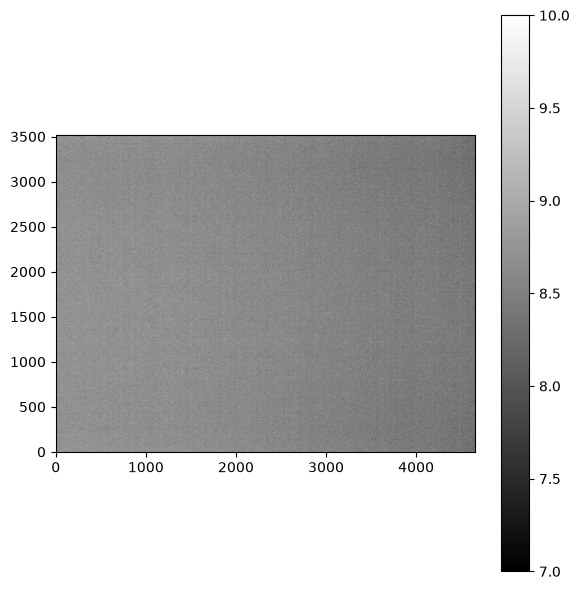

In [43]:
#TODO : Calculate the master bias by taking the average of all the bias frames and display
#the resulting image
master_bias = np.nanmedian(bias_images,axis=0)
show_image(master_bias)


As we can see, this bias is not completely uniform. At the left and bottom edges it is quite deviated from the average of the rest.


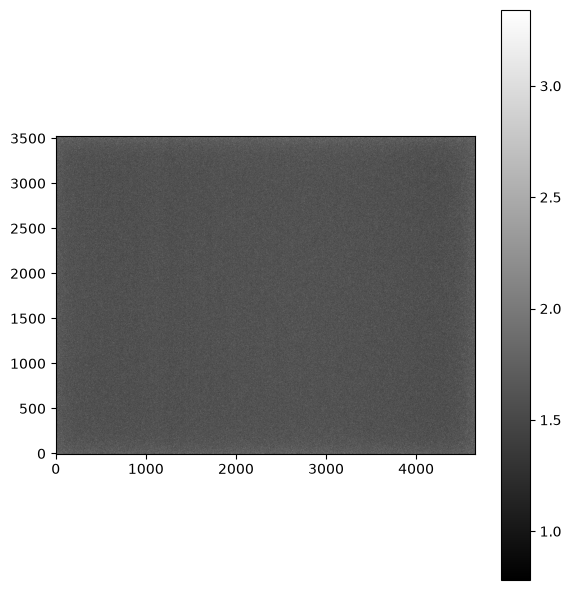

In [44]:
#TODO: What will the read noise be in counts?
np.nanstd(master_bias[500:1500,500:1500])

np.nanstd(bias_images[0,:,:]-bias_images[1,:,:])
show_image(np.nanstd(bias_images,axis=0))


NOTE: Reading all the pixels of the CCD can take quite a long time (~2min per image). For this reason, different camera configurations are typically used in which only part of the detector is read (an elongated strip for spectroscopy images and a central square for imaging), although sometimes it is indeed necessary to read the whole CCD if the object of study is very large.

In order to optimize time, bias calibration frames are typically taken by reading the entire detector when both imaging and spectroscopy are done in the same session, since they can then be cropped to the appropriate image size for each case, saving us from having to take 2 sets of bias frames.

In this case, we have to crop the master bias to the size of our science images. This is as simple as:


## Calculating the dark current: the Master Dark

Once we have the master bias, the next step in our "pipeline" will be to calculate the equivalent for the darks.

Note that the dark will also be affected by the bias. Therefore each dark frame must have the master_bias subtracted from it. Also, the dark current is proportional to time. Therefore in many cases we will want to normalize the dark current to 1s, and then multiply it by the exposure time of our science images.

Optionally, one can also have a set of "darks" for each exposure time used for the science images. In that case it would not be necessary to normalize the master dark by exposure time.


['Dark8s_00001.CameraSettings.txt', 'Dark8s_00001.fits', 'Dark8s_00002.fits', 'Dark8s_00003.fits', 'Dark8s_00004.fits', 'Dark8s_00005.fits', 'Dark8s_00006.fits', 'Dark8s_00007.fits', 'Dark8s_00008.fits', 'Dark8s_00009.fits', 'Dark8s_00010.fits']
TEXP :  8


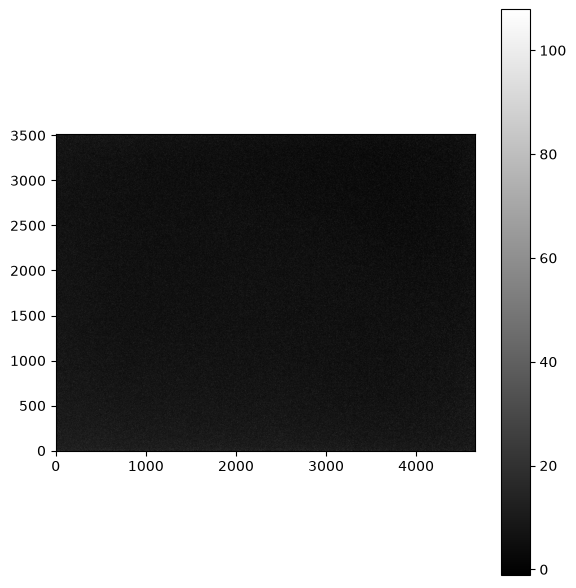

In [45]:
base_dark = base+r"\Dark8s\21_39_03\\" #Note that we don't have darks for the Calar Alto data, since this is practically 0
                          # If you do have some, change this path
darks,texp =read_set(base_dark) #We read the images
print("TEXP : ",texp[0] )
for i,dark in enumerate(darks):
  dark = dark
  darks[i] = (dark-master_bias)/(texp[i])*np.ones_like(darks[0]) #We normalize by exposure time (NOTE: I add the 1 since I'm using the bias, in which case TEXP=0)
master_dark = np.nanmedian(darks,axis=0)
master_dark_l = master_dark

show_image(master_dark) #We plot the master dark


In this case it is indeed more interesting to take the median instead of the mean, since during the dark exposures, even though no photons will reach the detector, cosmic rays can still affect it. One way to remove them is by taking the median, since unless two land in exactly the same spot, they will be easily removed with this statistic as long as more than 3 exposures are available.


## The Master Flat

Finally, regarding the calibration exposures, we will need to generate the master flat. Note that this will depend on the filter used, so we will want to generate a master flat for each one. This is because part of the flat is caused by dirt on the filter, which obviously will depend on each specific filter.



In [46]:
base_flat = base+r"\Flat_B\20_20_40\\"
#TODO: Read all the flats
flats, texp_flat  = read_set(base_flat)


['Flat_B_00001.CameraSettings.txt', 'Flat_B_00001.fits', 'Flat_B_00002.fits', 'Flat_B_00003.fits', 'Flat_B_00004.fits', 'Flat_B_00005.fits', 'Flat_B_00006.fits', 'Flat_B_00007.fits', 'Flat_B_00008.fits', 'Flat_B_00009.fits', 'Flat_B_00010.fits']


Now let's calculate the master flat. The first thing we will need to do is, for each individual flat exposure, subtract the master bias and the master dark.

Each flat exposure may have a different exposure time and a different average count level. But in the case of the flat, what interests us is the difference relative to the average, so we will need to normalize each exposure before combining them.

And finally, we will take the average of each of the flat exposures. Again, we can choose between the mean and the median.

Sometimes, to take the flats, a picture of the sky is taken during dawn or dusk, since during that period the sky is uniform enough to make a flat. However, due to the high sensitivity of telescopes, stars can sometimes appear in these "sky flats". In this case it is important to combine the images using the median to remove the stars from the master flat.


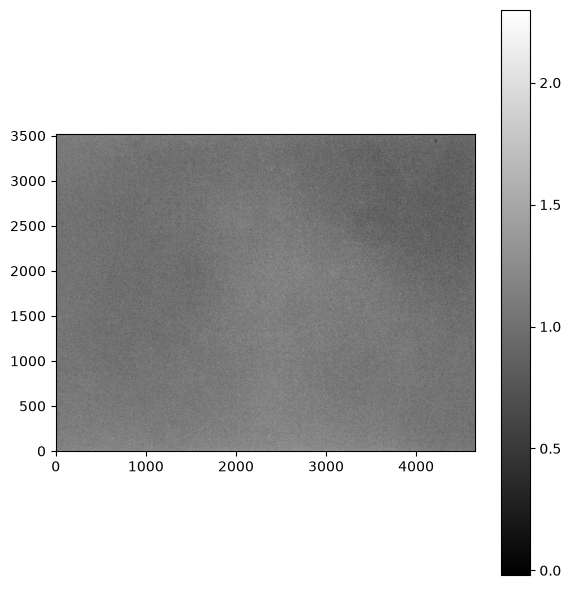

In [47]:
#TODO: Calculate the master flat.
for i , flat in enumerate(flats):
  flat = flat -master_bias - master_dark*texp_flat[i]
  flats[i] = flat/np.nanmedian(flat)

master_flat = np.nanmedian(flats,axis=0)
show_image(master_flat)


In [48]:
np.shape(master_dark)

(3520, 4656)

## The reduced Science image

We now have all the ingredients. We just need to apply the formula we set out before to calculate the reduced science images.

The physical quantity we want to measure will be the flux. So it is convenient to start working in terms of counts per second (i.e. dividing by the exposure time of each frame).

If you have followed the steps up to here, the dark current, or master dark, is already in units of counts per second. So the formula will be:
$$reduced \; science = \frac{raw\; science - master\_bias \;- \;master\_dark(texp) }{texp \; \times\; master\_flat} $$


['M57_B_00001.CameraSettings.txt', 'M57_B_00001.fits', 'M57_B_00002.fits', 'M57_B_00003.fits', 'M57_B_00004.fits', 'M57_B_00005.fits', 'M57_B_00006.fits', 'M57_B_00007.fits', 'M57_B_00008.fits', 'M57_B_00009.fits', 'M57_B_00010.fits', 'M57_B_00011.fits', 'M57_B_00012.fits', 'M57_B_00013.fits', 'M57_B_00014.fits', 'M57_B_00015.fits', 'M57_B_00016.fits', 'M57_B_00017.fits', 'M57_B_00018.fits', 'M57_B_00019.fits', 'M57_B_00020.fits']


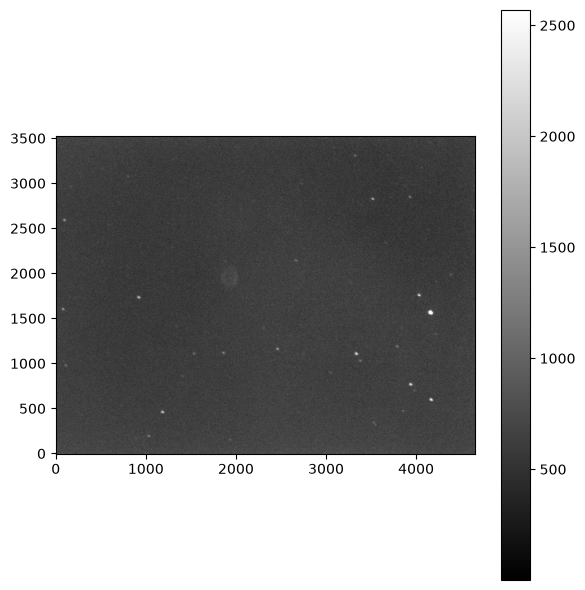

In [49]:
base_science = base+r"\M57_B\19_45_53\\"
#TODO: Read all the science images
science_raw,texp = read_set(base_science)
show_image(science_raw[1])


We need to fix the outliers in the flat


In [50]:
master_flat_new = master_flat.copy()
iden = np.where(master_flat_new<0.1)
master_flat_new[iden] = 0.1

['M57_B_00001.CameraSettings.txt', 'M57_B_00001.fits', 'M57_B_00002.fits', 'M57_B_00003.fits', 'M57_B_00004.fits', 'M57_B_00005.fits', 'M57_B_00006.fits', 'M57_B_00007.fits', 'M57_B_00008.fits', 'M57_B_00009.fits', 'M57_B_00010.fits', 'M57_B_00011.fits', 'M57_B_00012.fits', 'M57_B_00013.fits', 'M57_B_00014.fits', 'M57_B_00015.fits', 'M57_B_00016.fits', 'M57_B_00017.fits', 'M57_B_00018.fits', 'M57_B_00019.fits', 'M57_B_00020.fits']


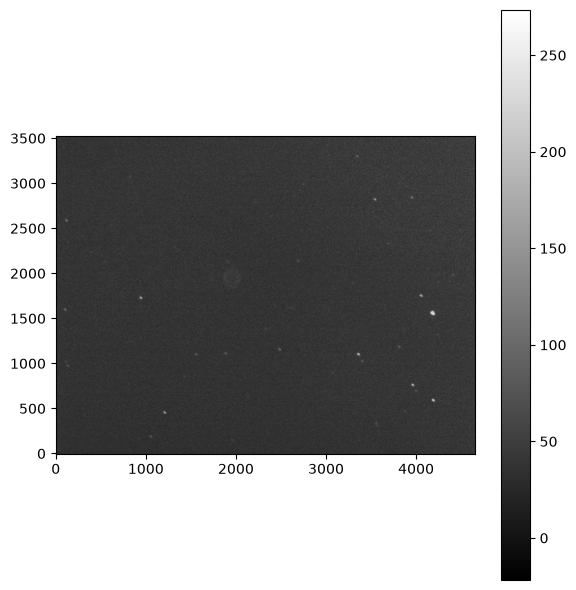

In [51]:
#TODO: Calculate the calibrated science images and divide by the
#exposure time to have everything in counts/s
science_raw,texp = read_set(base_science)
science_calib = []
threshold = 1e8 # 60000
for i, science in enumerate(science_raw):
  science[science>threshold] = np.nan
  calib = (science -master_bias -texp[i]*master_dark)/(texp[i]*master_flat_new)
  science_calib.append(calib)
science_calib = np.array(science_calib)
show_image(science_calib[0])



# Stacking

To increase the signal-to-noise ratio of our image, and be able to detect and measure fainter and fainter objects, there are two possibilities.

The first option, and perhaps the most obvious, is to increase the exposure time. However this is not always possible since problems can arise. The first is that in the same field where we want to measure a faint object, there may be another object that is very bright. Then if we expose for a long time to detect the faint object we might saturate the bright object.

Also, the longer the exposure time, the greater the probability of a cosmic ray hitting the detector that could ruin the image (or a transit of an artificial satellite).

With more amateur equipment, there can also be problems with telescope guiding, causing stars to acquire an elongated shape.

These problems can be solved with the second option: splitting the exposure time into several frames. However, this option is not ideal either. The main problem is that we are multiplying the read noise. Now we will not only have it in one frame, but it will be multiplied by however many frames we take. However, we have already seen that the read noise can be quite small, and as long as the exposure time is long enough for the signal to exceed this limit, it may be preferable to split the exposure into several frames.


## Alignment

However, combining several exposures is a process that requires taking several subtleties into account.

The first of these is correctly aligning the images. In order to integrate the frames we must make sure that the objects are in exactly the same place in all of them. This is not trivial, since sometimes the telescope moves between exposures, or even other objects are observed before returning to ours. The guiding system of professional telescopes is very good, but even in these cases the objects can move 1-2 pixels between two exposures. And in amateur telescopes this is even more pronounced.




In [52]:
from photutils.detection import DAOStarFinder
from astropy.stats import mad_std
from photutils.aperture import aperture_photometry, CircularAperture
from scipy.spatial import KDTree
from skimage.measure import ransac
from skimage.transform import AffineTransform, warp

# We take two calibrated science images to illustrate the alignment problem
image1 = science_calib[0][10:-10, 10:-10]
image2 = science_calib[1][10:-10, 10:-10]
bkg_sigma_1 = mad_std(image1)
bkg_sigma_2 = mad_std(image2)

print(bkg_sigma_1, bkg_sigma_2)



24.90447355389594 25.086703276631535


If we plot the difference between two of the science images, it will be easier to see that they are not correctly aligned


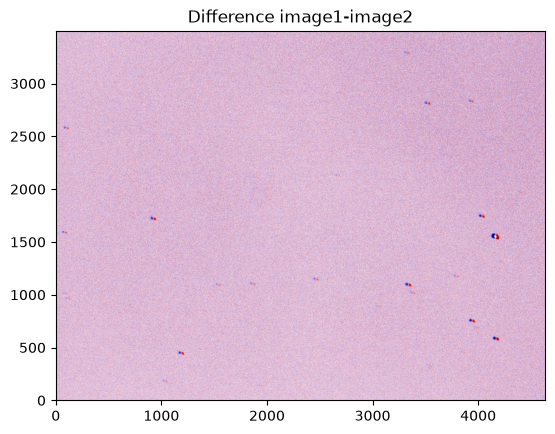

In [53]:
plt.title('Difference image1-image2')
plt.imshow(image1-image2,cmap='seismic',origin='lower',vmin = np.nanpercentile(image1-image2,1),vmax=np.nanpercentile(image1-image2,99))
plt.show()

In this section, we are going to look at a method we can use to align the images.

The first step will be to find the stars in the image in order to determine their positions.

There are several ways to do this; in this example we will use the DAOStarFinder function from Photutils:


In [54]:
daofind = DAOStarFinder(fwhm=8.0,threshold=11.0*bkg_sigma_1)
sources1 = daofind(image1)
daofind = DAOStarFinder(fwhm=8.0,threshold=11.5*bkg_sigma_2)
sources2 = daofind(image2)

And now let's plot the stars we have identified in both images. Depending on what the data looks like, we can tweak the parameters a bit to improve the identification.

In this example, the brightest star, HD15558, is very saturated and the algorithm identifies it as two distinct stars (obviously we cannot extract photometric information for this particular star with this example image)


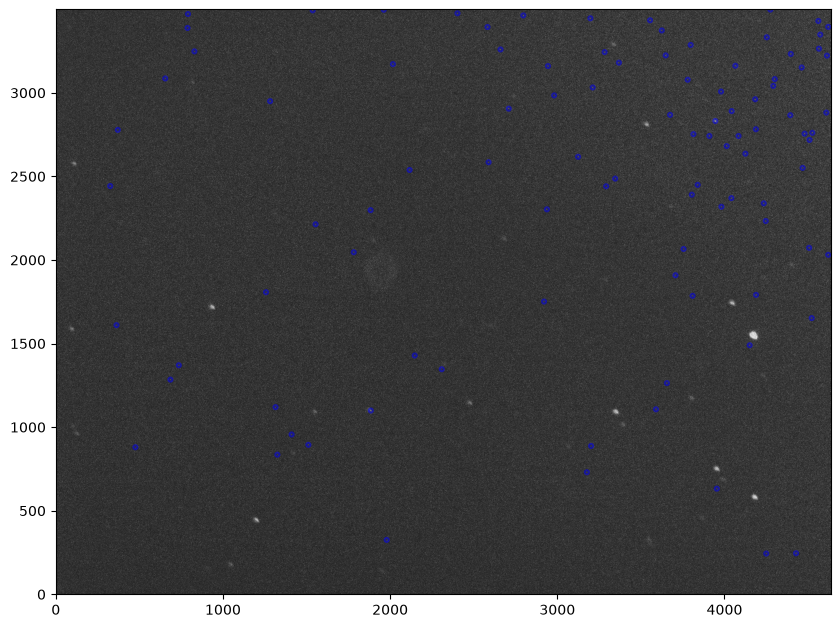

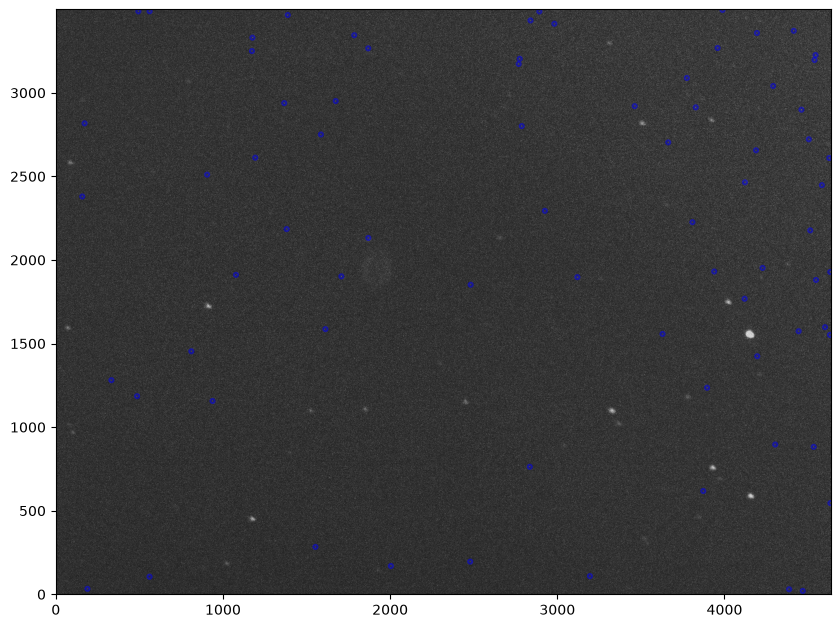

In [55]:
from photutils.aperture import aperture_photometry, CircularAperture
positions1 = np.transpose((sources1['xcentroid'], sources1['ycentroid']))
apertures1 = CircularAperture(positions1, r=12.)
phot_table1 = aperture_photometry(image1, apertures1)

positions2 = np.transpose((sources2['xcentroid'],sources2['ycentroid']))
apertures2 = CircularAperture(positions2, r=12.)
phot_table2 = aperture_photometry(image2, apertures2)

plt.figure(figsize=[10,10])
plt.imshow(image1,cmap='gray',origin='lower',vmin=np.nanpercentile(image1,1),vmax=np.nanpercentile(image1,99))
apertures1.plot(color='blue', lw=1.5, alpha=0.5)
plt.show()


plt.figure(figsize=[10,10])
plt.imshow(image2,cmap='gray',origin='lower',vmin=np.nanpercentile(image2,1),vmax=np.nanpercentile(image2,99))
apertures2.plot(color='blue', lw=1.5, alpha=0.5)
plt.show()

And how are we going to align the images? The algorithm we propose here is to take one image as a reference, and then apply an affine transformation. That is:
$$\tilde{I} = A\cdot  I + b $$
Where A is a 2x2 matrix, which accounts for rotations and distortions, and b is a vector that accounts for 2D displacements.

Therefore, we have 6 free parameters, so we will need at least 3 stars to be able to calculate these coefficients.

So the next step is to find at least the same 3 stars in both images. Instead of doing this manually, we will use an approach based on the efficient search of star positions in the images using a KD-tree (KDTree). This will allow us to quickly search for pairs of stars that correspond between both images.

In the following block of code, we use KDTree from the scipy.spatial library to create a data structure that stores the positions of the stars in one of the images (positions2). Then, we search for the closest stars in the other image (positions1) that are within a maximum radius (defined by the max_sep variable):




In [56]:
from scipy.spatial import KDTree

tree = KDTree(positions2)
max_sep = 20
matches = tree.query_ball_point(positions1,r=max_sep)


Once we have obtained the matching pairs, we proceed to filter those that are closest in terms of Euclidean distance, in order to get the best possible correspondence between the stars in both images:


In [57]:
matched_pairs = []
for i, match in enumerate(matches):
  if match:
    distances = np.linalg.norm(positions2[match]-positions1[i],axis=1)
    closest_match = match[np.argmin(distances)]
    matched_pairs.append((positions1[i],positions2[closest_match]))

points1_matched, points2_matched = zip(*matched_pairs)
points1_matched = np.array(points1_matched)
points2_matched = np.array(points2_matched)

In [58]:
points1_matched

array([[2937.73275689, 2302.92269499],
       [4508.8051469 , 2718.20048555],
       [4291.87355583, 3041.39102217],
       [3779.84753075, 3078.14701965]])

In [59]:
points2_matched

array([[2925.57654464, 2293.83180358],
       [4504.47253178, 2722.04730514],
       [4290.99726968, 3040.76715539],
       [3774.77475923, 3088.76180769]])

Now that we have identified at least 3 pairs of matching stars, we can proceed with the alignment process using an affine transformation. To do this, we use the RANSAC (Random Sample Consensus) algorithm, which allows fitting a robust transformation to the corresponding points, eliminating possible errors (outliers) that may arise due to false matches.


In [60]:
from skimage.measure import ransac
from skimage.transform import AffineTransform, warp


model_robust, inliers = ransac(
    (points1_matched, points2_matched),
    AffineTransform,
    min_samples=3,
    residual_threshold=2,
    max_trials=1000
)

Finally, we apply the robust affine transformation obtained to align the image1 image with respect to the reference image using the warp function:


In [61]:
aligned_image1 = warp(image1, inverse_map =model_robust.inverse, output_shape=image1.shape )

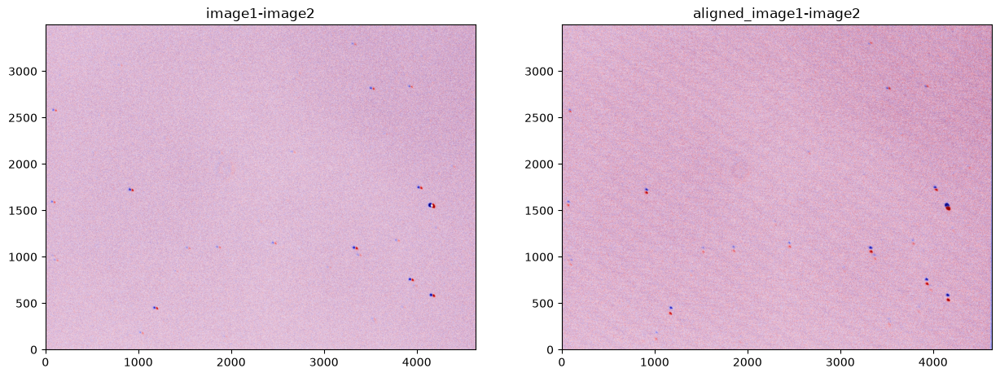

In [62]:
fig, axes = plt.subplots(1, 2, figsize=(15, 10))
axes[0].imshow(image1 - image2, cmap='seismic', origin='lower', vmin=np.nanpercentile(image1 - image2, 1), vmax=np.nanpercentile(image1 - image2, 99))
axes[0].set_title('image1-image2')

axes[1].imshow(aligned_image1 - image2, cmap='seismic', origin='lower', vmin=np.nanpercentile(image1 - image2, 1), vmax=np.nanpercentile(image1 - image2, 99))
axes[1].set_title('aligned_image1-image2')

plt.show()


I will make a crop of the Nebula


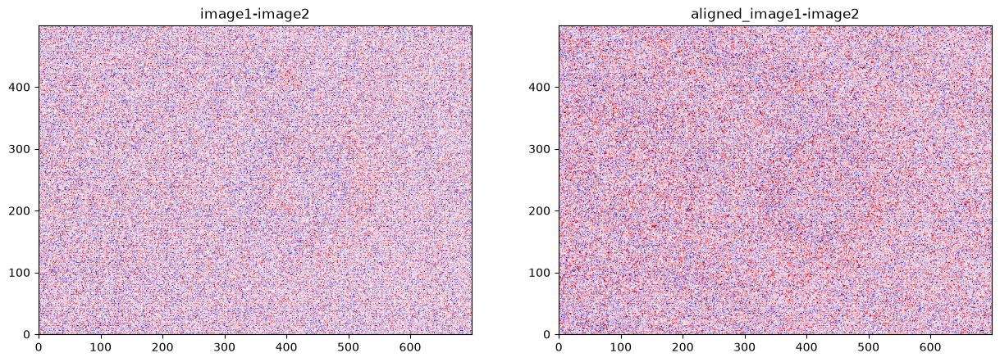

In [63]:
fig, axes = plt.subplots(1, 2, figsize=(15, 10))
axes[0].imshow(image1[1700:2200,1500:2200] - image2[1700:2200,1500:2200], cmap='seismic', origin='lower', vmin=np.nanpercentile(image1 - image2, 1), vmax=np.nanpercentile(image1 - image2, 99))
axes[0].set_title('image1-image2')

axes[1].imshow(aligned_image1[1700:2200,1500:2200] - image2[1700:2200,1500:2200], cmap='seismic', origin='lower', vmin=np.nanpercentile(image1 - image2, 1), vmax=np.nanpercentile(image1 - image2, 99))
axes[1].set_title('aligned_image1-image2')

plt.show()


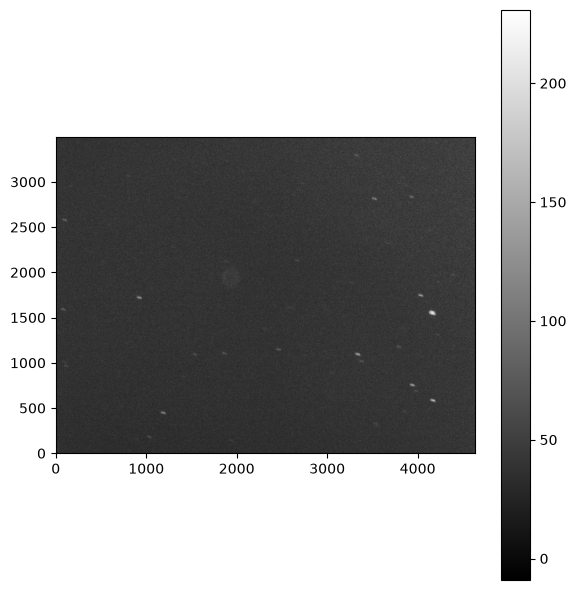

In [64]:
stacked_image = np.mean([image1,image2],axis=0)
show_image(stacked_image)

## Generalizing the stacking to all images

The previous example aligns and combines only two images. To improve the signal-to-noise ratio we need to apply the same procedure to all the available science frames.

A first attempt was to directly extend the previous code in a loop, but it did not manage to produce a real stacked image: the accumulator was never updated correctly between iterations. The version that finally works repeats the star-detection process independently on each image (instead of relying on a precomputed list of positions), and combines the results using the median, which is robust against misaligned edges (filled with NaN after the `warp`) and against cosmic rays.



Aligning 20 images...


Frame 1: aligned with 4083 stars (46 inliers).


Frame 2: aligned with 4112 stars (28 inliers).


Frame 3: aligned with 4020 stars (49 inliers).


Frame 4: aligned with 4142 stars (38 inliers).


Frame 5: aligned with 4136 stars (32 inliers).


Frame 6: aligned with 4081 stars (24 inliers).


Frame 7: aligned with 4004 stars (29 inliers).


Frame 8: aligned with 4012 stars (26 inliers).


Frame 9: aligned with 4119 stars (40 inliers).


Frame 10: aligned with 4072 stars (29 inliers).


Frame 11: aligned with 4153 stars (29 inliers).


Frame 12: aligned with 4075 stars (26 inliers).


Frame 13: aligned with 4145 stars (33 inliers).


Frame 14: aligned with 4173 stars (31 inliers).


Frame 15: aligned with 4129 stars (26 inliers).


Frame 16: aligned with 4156 stars (35 inliers).


Frame 17: aligned with 4102 stars (23 inliers).


Frame 18: aligned with 4050 stars (24 inliers).


Frame 19: aligned with 4119 stars (38 inliers).


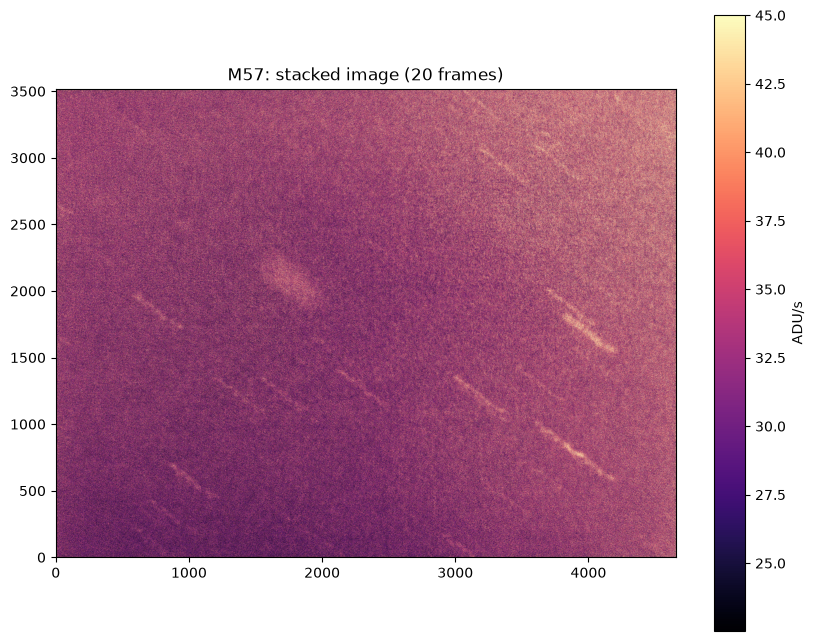

In [65]:
def alinear_y_apilar(lista_imagenes, fwhm=4.0, threshold_sigma=5.0, max_sep=50):
    """
    Aligns a list of science images with respect to the first one (reference)
    by detecting stars in each image and fitting a robust affine
    transformation (RANSAC). Combines the results using the median, ignoring the
    edges with no data (NaN) left by the warp and possible cosmic rays.
    """
    img_ref = lista_imagenes[0].astype(np.float32)
    shape_img = img_ref.shape

    # Reference stars: detected only once
    bkg_sigma_ref = mad_std(img_ref, ignore_nan=True)
    daofind = DAOStarFinder(fwhm=fwhm, threshold=threshold_sigma * bkg_sigma_ref)
    sources_ref = daofind(img_ref)
    pos_ref = np.transpose((sources_ref['xcentroid'], sources_ref['ycentroid']))
    tree_ref = KDTree(pos_ref)

    aligned_images = [img_ref]  # the reference does not need a transformation

    print(f"Aligning {len(lista_imagenes)} images...")
    for i in range(1, len(lista_imagenes)):
        img_actual = lista_imagenes[i].astype(np.float32)

        sources_cur = daofind(img_actual)
        if sources_cur is None or len(sources_cur) == 0:
            print(f"Frame {i}: no stars detected. Skipping.")
            continue

        pos_cur = np.transpose((sources_cur['xcentroid'], sources_cur['ycentroid']))

        matches = tree_ref.query_ball_point(pos_cur, r=max_sep)
        pares = [
            (pos_cur[idx], pos_ref[m[np.argmin(np.linalg.norm(pos_ref[m] - pos_cur[idx], axis=1))]])
            for idx, m in enumerate(matches) if m
        ]

        if len(pares) < 3:
            print(f"Frame {i}: only {len(pares)} matches. Not enough, skipping.")
            continue

        p_cur, p_ref = zip(*pares)
        try:
            modelo, inliers = ransac(
                (np.array(p_cur), np.array(p_ref)),
                AffineTransform, min_samples=3,
                residual_threshold=2, max_trials=500
            )
        except Exception as e:
            print(f"Frame {i}: RANSAC failed ({e}). Skipping.")
            continue

        img_alineada = warp(
            img_actual, inverse_map=modelo.inverse,
            output_shape=shape_img, order=3,
            cval=np.nan, preserve_range=True
        )
        aligned_images.append(img_alineada)
        print(f"Frame {i}: aligned with {len(pares)} stars ({sum(inliers)} inliers).")

    stack = np.array(aligned_images)
    # The median ignores the NaNs from the rotated edges and is robust against cosmic rays
    return np.nanmedian(stack, axis=0)


img_final = alinear_y_apilar(science_calib)

plt.figure(figsize=(10, 8))
vmin = np.nanpercentile(img_final, 5)
vmax = np.nanpercentile(img_final, 95)
plt.imshow(img_final, cmap='magma', origin='lower', vmin=vmin, vmax=vmax)
plt.colorbar(label='ADU/s')
plt.title(f"M57: stacked image ({len(science_calib)} frames)")
plt.show()



## High Dynamic Range (HDR)

In the case of having very bright and very faint objects simultaneously in the same field, we will have to deal with a problem.

If we want to measure the bright object, the exposure time cannot be very long, otherwise we will saturate this object. But then we might not be able to measure the faint object.

If we want to measure the faint object, we can increase the exposure time. But in this case the bright object will appear saturated.

How do we solve this problem? Take two exposures. One with a short exposure time so as not to saturate the bright object, and another with a long exposure time, to measure the faint object. Then what we will do is, once calibrated, mask the saturated pixels in the long exposure, and adopt the values at those locations from the short exposure.


# Measuring physical units: Flux Calibration

At this point, we have prepared the data so we can do science. However, a very important step remains. So far, the calibrated images measure the number of counts produced in each pixel per second of exposure. What is the relationship with the energy flux we measure? What is the relationship between our counts/second and Watts/second or magnitudes?

What we are going to describe in this section is how the so-called flux calibration is performed. For this, we will rely on standard reference stars. We will measure their "instrumental flux", how many counts/second reach our detector, and we will compare it with their "physical flux" which is tabulated. And we will apply this same relationship to the rest of our image


## Flux and the PSF

The first step for flux calibration will be to measure the amount of photons reaching us from our reference star.

Formally, due to the enormous distances that separate us from the stars, we can consider them as point sources of light. However, that is not what we observe in the images. We see them as circles. This is due to 2 effects. First, the intrinsic diffraction caused by the telescope, and second, atmospheric turbulence. The limiting factor will be, in almost all cases, this atmospheric turbulence.

This causes all the star's light to "spread out" over a certain area. The function that describes how the star's light is distributed on the detector is called the "Point-Spread Function" or PSF.

The idea is that all the stars in the same exposure have approximately the same PSF. The amplitude of this PSF is determined by the brightness of the star, and the width is determined by the atmospheric conditions and the optical system.

This width is sometimes called "seeing", which under normal observing conditions is usually ~1 arcsecond.


Sources detected: 152


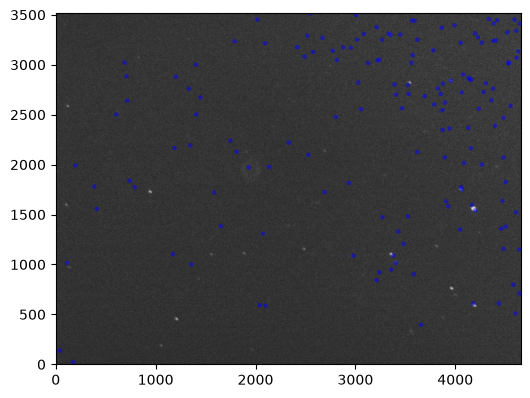

In [66]:
ref_image = science_calib[0]

bkg_sigma = mad_std(ref_image)
fwhm = 4.0
threshold = 14. * bkg_sigma

daofind = DAOStarFinder(
    fwhm=fwhm,
    threshold=threshold
)

sources = daofind(ref_image)

positions = np.transpose((
    sources['x_centroid'],
    sources['y_centroid']
))

apertures = CircularAperture(positions, r=12.)

print(f"Sources detected: {len(positions)}")

plt.figure(figsize=[6,6])
plt.imshow(
    ref_image,
    cmap='gray',
    origin='lower',
    vmin=np.nanpercentile(ref_image, 1),
    vmax=np.nanpercentile(ref_image, 99)
)
apertures.plot(color='blue', lw=1.5, alpha=0.5)
plt.show()


In [67]:
from photutils.centroids import centroid_quadratic

def refine_star_position(ref_image, x_approx, y_approx, box=40):
    """
    Refines the position of a star whose approximate center we already know,
    by cropping only a small region around it and centroiding there.
    Much faster than analyzing the entire image, and does not depend on any
    threshold or global background map.
    """
    x0, y0 = int(round(x_approx)), int(round(y_approx))
    sub = ref_image[y0-box:y0+box, x0-box:x0+box]
    xc, yc = centroid_quadratic(sub)
    return x0 - box + xc, y0 - box + yc



The first step will be to select a reference star.



In [68]:
positions.shape

(152, 2)

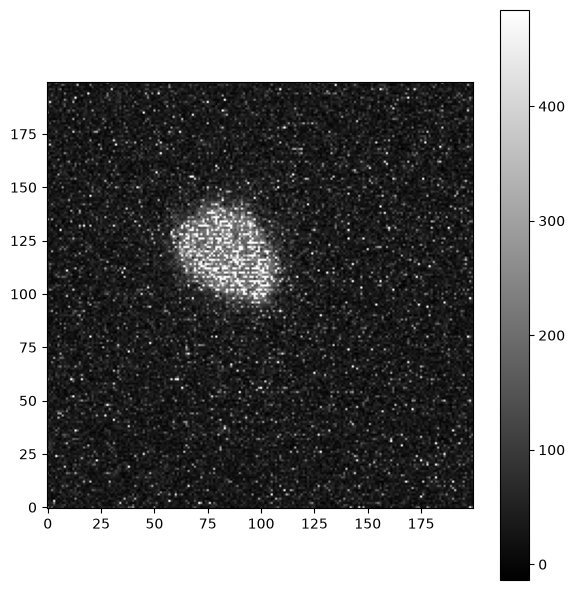

In [69]:
from photutils.aperture import CircularAnnulus, CircularAperture, aperture_photometry, ApertureStats
#TODO: Display the crop of the science image around a star
# (this is just any example star, not a calibration star,
# so we automatically pick the brightest one detected, to
# make sure it is a real star and not noise)
i_star = np.argmax(sources['flux'])
range = 100
x_star = int(positions[i_star,0])
y_star = int(positions[i_star,1])
star_image = ref_image[y_star-range:y_star+range,x_star-range:x_star+range]
show_image(star_image)


Once we have located the reference star, what we want to measure is how many counts reach us from that star. In other words, we want to sum all the counts associated with that object. But how far out should we sum?

The first thing we are going to do is measure the star's flux profile.


In [70]:
positions

array([[ 174.01856007,   23.3999941 ],
       [  40.50800028,  138.03911414],
       [3656.69774056,  396.00230721],
       [4603.55579597,  510.09845192],
       [2099.99170122,  586.63212765],
       [2039.95465434,  592.03118574],
       [4183.8917625 ,  608.90667262],
       [4438.63456547,  609.96034713],
       [4644.63917358,  709.96668362],
       [4582.48264052,  796.31624864],
       [3213.55672434,  842.01471317],
       [3584.60414411,  902.4064256 ],
       [3239.05081254,  922.51420565],
       [3359.14027847,  949.62180983],
       [1358.26602284, 1000.23048176],
       [3402.33699289, 1014.03263159],
       [ 113.30690203, 1015.94644644],
       [2982.57803888, 1088.03502353],
       [3381.25494079, 1089.80159838],
       [1174.39780923, 1103.9182413 ],
       [4640.21347883, 1149.41759768],
       [4483.90956633, 1157.38469666],
       [3481.87144444, 1206.36789376],
       [2075.81314038, 1308.31128618],
       [3430.07800132, 1329.67478488],
       [4047.76534752, 13

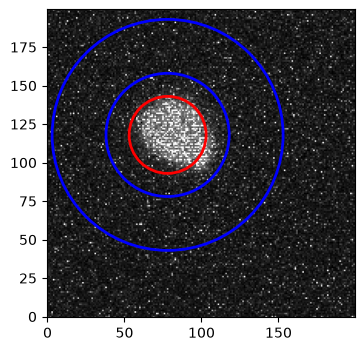

In [71]:
from photutils.profiles import RadialProfile
from photutils.centroids import centroid_quadratic

#TODO:  Display a circular aperture around the star and an annular
#aperture around it. HINT: Use CircularAperture and CircularAnnulus
#from photutils

ind_max = np.unravel_index(np.argmax(star_image,axis=None),star_image.shape) #We use as a first guess that the center of the star is in the peak of lumino
xycen = centroid_quadratic(star_image,xpeak=ind_max[1],ypeak=ind_max[0],fit_boxsize=[51,51]) #We search the centroid of the star

posicion_new = [ind_max[1]-10,ind_max[0]+10] #I set this manually since the program failed to detect the center
xycen = posicion_new

#aperture = CircularAperture(xycen,r=25)
aperture = CircularAperture(xycen,r=25) # I modified the radius so that it fits better
annulus_aperture = CircularAnnulus(posicion_new,r_in=40,r_out=75) #We take a ring aperture to estimate the contribution of the sky

plt.figure(figsize=[4,4],dpi=100)
plt.imshow(star_image,vmin=np.nanpercentile(star_image,1),
           vmax=np.nanpercentile(star_image,99),cmap='gray',origin='lower')
ap_patches = aperture.plot(color='red',lw=2,
                           label='Photometry Aperture')
ann_patches = annulus_aperture.plot(color='blue',lw=2,
                                    label='Background annulus')



In [72]:
xycen

[np.int64(78), np.int64(118)]

In [73]:
ind_max[1]

np.int64(88)

In [74]:
#TODO: Estimate the flux coming from the star, and from the sky
#using the apertures defined above
background = ApertureStats(star_image,annulus_aperture).mean
total_flux = ApertureStats(star_image,aperture).sum

star_flux = total_flux - aperture.area* background

print("Mean flux from the sky : ", background, "counts/s/pixel")
print("Total flux : ", total_flux, "counts/s")
print("Star flux : ", star_flux, "counts/s")


Mean flux from the sky :  47.03468265675883 counts/s/pixel
Total flux :  708837.9765527595 counts/s
Star flux :  616485.593116259 counts/s


In [75]:
#TODO: What is the instrumental magnitude?


In [76]:
minst = -2.5 * np.log10(star_flux)
print("Instrumental Magnitude : ", minst, "mag")


Instrumental Magnitude :  -14.474807329648037 mag


Now that we have located our star, we are going to measure its flux profile, that is, how the flux changes as we move away from the center of the star.

In many cases, this PSF can be modeled as a Gaussian. We are going to measure the PSF and see how well it fits...


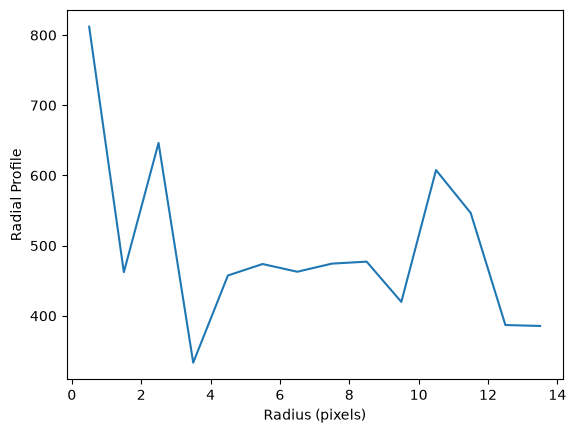

In [77]:
from photutils.profiles import RadialProfile
#TODO: Use RadialProfile from photutils to calculate the star's PSF and
#fit it to a Gaussian function. Also plot where sqrt(5/2)*fwhm falls
edge_radii = np.arange(15)
rp = RadialProfile(star_image-background,xycen,edge_radii,mask=None)
rp.plot()


Model: Gaussian1D
Inputs: ('x',)
Outputs: ('y',)
Model set size: 1
Parameters:
        amplitude     mean       stddev     
    ----------------- ---- -----------------
    587.0853660567349  0.0 14.80322611347814
FWHM :  34.858933583143916


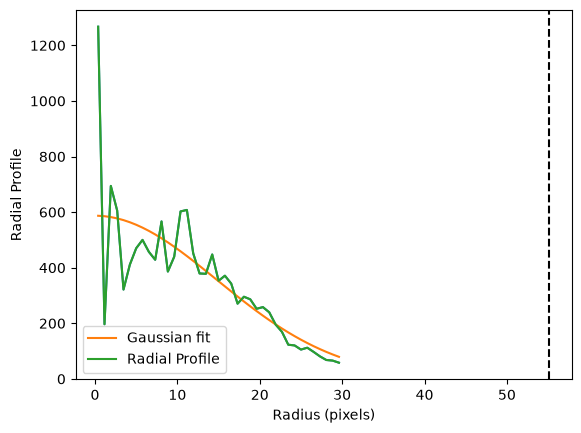

In [78]:

edge_radii = np.arange(15)
edge_radii = np.linspace(0,30,40)

rp = RadialProfile(star_image-background,xycen,edge_radii,mask=None)
plt.plot(rp.radius,rp.profile)

fit_params=rp.gaussian_fit
fit = fit_params.amplitude*np.exp(-(rp.radius-fit_params.mean)**2/(2*fit_params.stddev**2))
fwhm = rp. gaussian_fwhm
plt.plot(rp.radius,fit,label='Gaussian fit')
rp.plot(label='Radial Profile')
plt.axvline(np.sqrt(5/2)*fwhm,color='k',linestyle='dashed')
plt.legend()
print(fit_params)
print("FWHM : ",fwhm)

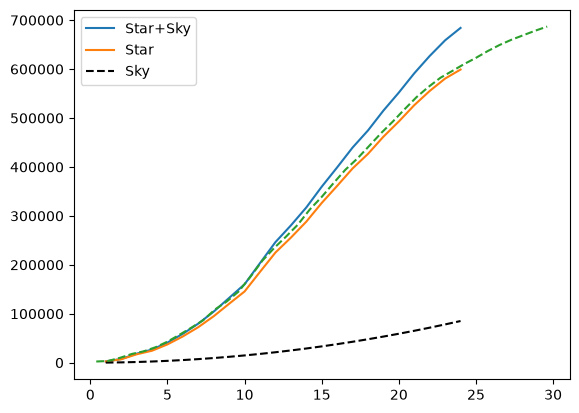

In [79]:
from photutils.profiles import CurveOfGrowth
#TODO: Plot the integrated profile of the star, with and without subtracting the sky
#brightness. HINT: Use CurveOfGrowth from Photutils
radii = np.arange(1,25)
cog = CurveOfGrowth(star_image,xycen,radii)

cog_nobg = CurveOfGrowth(star_image-background,xycen,radii)


plt.plot(cog.radius,cog.profile,label='Star+Sky')
plt.plot(cog_nobg.radius,cog_nobg.profile,label='Star')

plt.plot(cog.radius,cog.radius**2 *np.pi *background,linestyle='dashed',color='k',label='Sky')
plt.plot(rp.radius,2*np.pi*np.cumsum(rp.profile *rp.radius)*np.diff(edge_radii),linestyle='dashed',color='tab:green')

plt.legend()


## Flux Calibration: Relative Photometry
At this point, we have already been able to measure the light reaching our detector from the different sources. However, this flux that we measure on our detector is in units that are not very useful for doing science, since depending on the detector, the optical system, etc., this instrumental flux will vary.

So we have left the final step, flux calibration. Going from counts per second to magnitudes in some given photometric system, or ideally to W/m^2/s.

For this we are going to describe the 2 most common methods: relative and absolute photometry.

Let's start with relative photometry. Suppose we know the flux/magnitude of one or more stars that appear in the image we are studying. This can be done by looking up the star in some catalog in which the same filter was used as the one we used to take our science image


Right now we are already able to measure what we will call the instrumental magnitude, which is nothing more than:
$$m_{\rm instrumental} = -2.5 \log_{10}(F({\rm counts/s})) $$

Remember that magnitudes are generally defined relative to a reference, for example:
$$V = -2.5\log_{10}(F_{\rm star, V}/F_{\rm Vega, V})$$

Thanks to the properties of logarithms, we can relate the instrumental magnitudes to the standard ones through a constant, the zero point of the system:
$$m_{\rm  instrumental,V} = V + C_V $$


A quite useful source for looking up the data of reference stars is https://sky.esa.int/esasky, where several catalogs can be consulted simultaneously. Also very useful are http://simbad.cds.unistra.fr/simbad/ and https://vizier.cds.unistra.fr/viz-bin/VizieR


NOTE: In many cases the photometric system used for the catalog we are consulting (e.g. Gaia EDR3, SDSS, 2MASS...) will be different from the one we use (in most cases it will be Johnson-Cousins)
Here, for example, is how to convert from Gaia to Johnson (https://gea.esac.esa.int/archive/documentation/GEDR3/Data_processing/chap_cu5pho/cu5pho_sec_photSystem/cu5pho_ssec_photRelations.html Table 5.7):

$G - V = -0.02704 +0.01424(G_{\rm BP} - G_{\rm RP}) -0.2156(G_{\rm BP} - G_{\rm RP})^2 +0.01426 (G_{\rm BP} - G_{\rm RP})^3$

$G - R = -0.02275 +0.3961(G_{\rm BP} - G_{\rm RP}) -0.1243(G_{\rm BP} - G_{\rm RP})^2 -0.01396(G_{\rm BP} - G_{\rm RP})^3 + 0.003775 (G_{\rm BP} - G_{\rm RP})^4$


$G - I_C = 0.01753 +0.76(G_{\rm BP} - G_{\rm RP}) -0.0991(G_{\rm BP} - G_{\rm RP})^2$


The catalog we consulted to look up the calibration stars is in the Gaia system, so we will first define some functions to convert to the Johnson system:


In [80]:
#TODO: Define the functions to convert GAIA magnitudes to Johnson
#magnitudes.

def gaia_to_I(G,Gbp,Grp):
  color = Gbp - Grp
  return G -0.01753 -0.76*color +0.0991*color**2

def gaia_to_R(G,Gbp,Grp):
  color = Gbp - Grp
  return G +0.02275 -0.3961*color +0.1243*color**2 +0.01396*color**3 -0.003775*color**4

def gaia_to_V(G,Gbp,Grp):
  color = Gbp - Grp
  return G +0.02704 -0.01424*color +0.2156*color**2 -0.01426*color**3

from scipy.optimize import brentq

def gaia_to_B(G,Gbp,Grp):
  color_gaia = Gbp - Grp

  G_minus_V = (
      -0.02704
      + 0.01424*color_gaia
      - 0.2156*color_gaia**2
      + 0.01426*color_gaia**3
  )

  def equation(B_minus_V):
    return (
        -0.04749
        - 0.0124*B_minus_V
        - 0.2901*B_minus_V**2
        + 0.02008*B_minus_V**3
        - G_minus_V
    )

  B_minus_V = brentq(equation, -0.4, 3.3)

  V = G - G_minus_V
  B = V + B_minus_V

  return B


G = 16.6445
Gbp = 17.1121
Grp = 15.7478

I = gaia_to_I(G,Gbp,Grp)
R = gaia_to_R(G,Gbp,Grp)
V = gaia_to_V(G,Gbp,Grp)

print("Tabulated I magnitude : ",np.round(I,4))
print("Tabulated R magnitude : ",np.round(R,4))
print("Tabulated V magnitude : ",np.round(V,4))


Tabulated I magnitude :  15.7746
Tabulated R magnitude :  16.3806
Tabulated V magnitude :  17.0172


In [84]:
G_star1 = 11.2366
GBP_star1 = 11.6181
GRP_star1 = 10.6929

G_star2 = 17.7704
GBP_star2 = 18.5936
GRP_star2 = 16.8565

G_star3 = 18.2845
GBP_star3 = 19.5936
GRP_star3 = 17.1768


In [85]:
B_star1 = gaia_to_B(G_star1, GBP_star1, GRP_star1)
B_star2 = gaia_to_B(G_star2, GBP_star2, GRP_star2)
B_star3 = gaia_to_B(G_star3, GBP_star3, GRP_star3)

print("B star 1:", np.round(B_star1, 4))
print("B star 2:", np.round(B_star2, 4))
print("B star 3:", np.round(B_star3, 4))


B star 1: 12.1126
B star 2: 19.7482
B star 3: 21.312


Ideally, we will take as many calibration stars as possible, since this will help us reduce the error in the conversion from instrumental magnitudes to standard magnitudes.

The key will be to measure the total flux of the stars in our images, using the same aperture in all cases.


### Write down the coordinates of your calibration stars (only once)

Run the following cell and click, in this order, on: the reference star (bright), star 2 (G≈17.8) and star 3 (G≈18.3). Copy the 3 pairs of coordinates it prints into the `TODO` in the cell after this one.



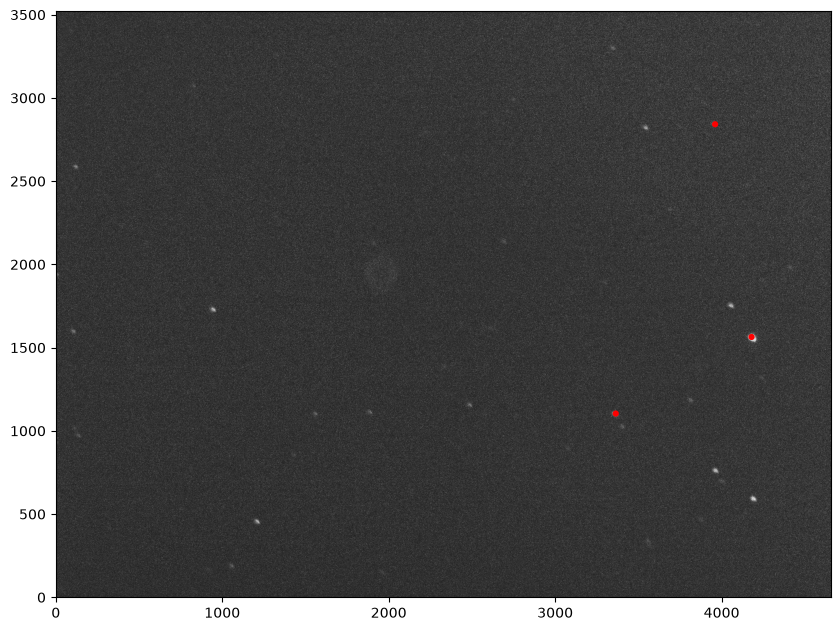

In [86]:
# Approximate coordinates of the 3 calibration stars, identified
# visually on the plot from the previous version (bottom-left,
# bottom-right, top). refine_star_position adjusts the exact
# center from here.
x1_approx, y1_approx = 3400.31708027, 1100.59763838    # G_star1 = 11.2366 (bottom left)
x2_approx, y2_approx = 4200.10664149 , 1600.13382458   # G_star2 = 17.7704 (bottom right)
x3_approx, y3_approx = 4000.68980704 , 2870.03655864  # G_star3 = 18.2845 (top)

range = 100

def crop_around(ref_image, x_star, y_star, range):
    # "safe" crop: clips to the edges of the image instead of wrapping
    # around with negative indices
    h, w = ref_image.shape
    y0, y1 = max(0, y_star-range), min(h, y_star+range)
    x0, x1 = max(0, x_star-range), min(w, x_star+range)
    return ref_image[y0:y1, x0:x1]

x_star1, y_star1 = refine_star_position(ref_image, x1_approx, y1_approx)
x_star1, y_star1 = int(x_star1), int(y_star1)
star1 = crop_around(ref_image, x_star1, y_star1, range)



x_star2, y_star2 = refine_star_position(ref_image, x2_approx, y2_approx)
x_star2, y_star2 = int(x_star2), int(y_star2)
star2 = crop_around(ref_image, x_star2, y_star2, range)



x_star3, y_star3 = refine_star_position(ref_image, x3_approx, y3_approx)
x_star3, y_star3 = int(x_star3), int(y_star3)
star3 = crop_around(ref_image, x_star3, y_star3, range)



xycen = np.array([[x_star1,y_star1],[x_star2,y_star2],[x_star3,y_star3]])


plt.figure(figsize=[10,10],dpi=100)
plt.imshow(ref_image,vmin=np.nanpercentile(ref_image,1),
           vmax=np.nanpercentile(ref_image,99),cmap='gray',origin='lower')
aperture = CircularAperture(xycen,r=10)

ap_patches = aperture.plot(color='red',lw=2,
                           label='Photometry Aperture')
plt.show()


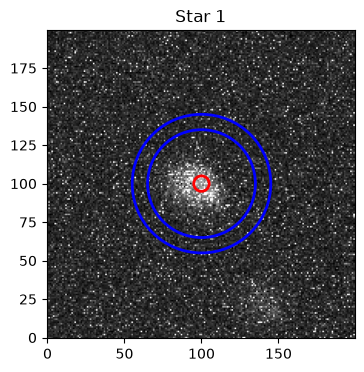

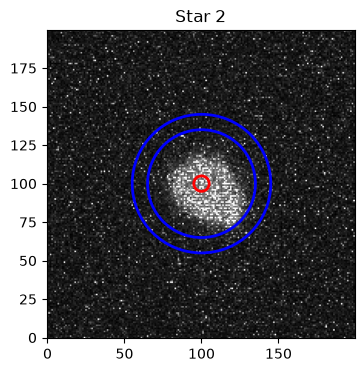

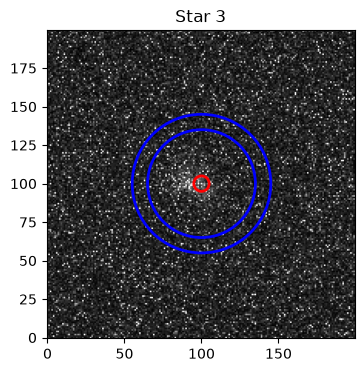

Star 1 : 
FWHM :  24.433478370814694
Average sky flux :  40.972534509990574  counts/s/pixel
Star flux + sky :  21834.33363750469  counts/s
Star flux :  18616.358302116172  counts/s
Instrumental magnitude :  -10.674736822658225
I band magnitude :  10.600747108463999


Star 2 : 
FWHM :  37.38786029489641
Average sky flux :  52.638369657902736  counts/s/pixel
Star flux + sky :  45335.176013950484  counts/s
Star flux :  41200.96812859521  counts/s
Instrumental magnitude :  -11.53726855270218
I band magnitude :  16.731709876230997


Star 3 : 
FWHM :  21.251354728436805
Average sky flux :  47.540932181196396  counts/s/pixel
Star flux + sky :  10065.3868448718  counts/s
Star flux :  6331.530762740371  counts/s
Instrumental magnitude :  -9.503771803258555
I band magnitude  :  17.009037393984002




In [87]:
#TODO: For the stars above, derive the instrumental magnitude
#and the tabulated magnitude for the filter corresponding to the image
aperture = CircularAperture(xycen,r=5)
annulus_aperture = CircularAnnulus(xycen,r_in=35,r_out=45)

# Visualization of the apertures on each crop

aperture_crop = CircularAperture((range, range), r=5)
annulus_crop = CircularAnnulus((range, range), r_in=35, r_out=45)

plt.figure(figsize=[4,4], dpi=100)
plt.title("Star 1")
plt.imshow(star1,
           vmin=np.nanpercentile(star1,1),
           vmax=np.nanpercentile(star1,99),
           cmap='gray',
           origin='lower')
aperture_crop.plot(color='red', lw=2)
annulus_crop.plot(color='blue', lw=2)
plt.show()


plt.figure(figsize=[4,4], dpi=100)
plt.title("Star 2")
plt.imshow(star2,
           vmin=np.nanpercentile(star2,1),
           vmax=np.nanpercentile(star2,99),
           cmap='gray',
           origin='lower')
aperture_crop.plot(color='red', lw=2)
annulus_crop.plot(color='blue', lw=2)
plt.show()


plt.figure(figsize=[4,4], dpi=100)
plt.title("Star 3")
plt.imshow(star3,
           vmin=np.nanpercentile(star3,1),
           vmax=np.nanpercentile(star3,99),
           cmap='gray',
           origin='lower')
aperture_crop.plot(color='red', lw=2)
annulus_crop.plot(color='blue', lw=2)
plt.show()


background = ApertureStats(ref_image,annulus_aperture[0]).mean
total_flux = ApertureStats(ref_image,aperture[0]).sum
star_flux = total_flux - aperture.area* background

radii = np.arange(1,25)
rp = RadialProfile(ref_image-background,xycen[0],radii,mask=None)

print("Star 1 : ")
print("FWHM : ",rp.gaussian_fwhm)
print("Average sky flux : ", background," counts/s/pixel")
print("Star flux + sky : ",total_flux," counts/s")
print("Star flux : ", star_flux," counts/s")
print("Instrumental magnitude : ",-2.5*np.log10(star_flux))
print("I band magnitude : ",gaia_to_I(G_star1,GBP_star1,GRP_star1))
print("\n")

background = ApertureStats(ref_image,annulus_aperture[1]).mean
total_flux = ApertureStats(ref_image,aperture[1]).sum
star_flux = total_flux - aperture.area* background

rp = RadialProfile(ref_image-background,xycen[1],radii,mask=None)

print("Star 2 : ")
print("FWHM : ",rp.gaussian_fwhm)
print("Average sky flux : ", background," counts/s/pixel")
print("Star flux + sky : ",total_flux," counts/s")
print("Star flux : ", star_flux," counts/s")
print("Instrumental magnitude : ",-2.5*np.log10(star_flux))
print("I band magnitude : ",gaia_to_I(G_star2,GBP_star2,GRP_star2))
print("\n")

background = ApertureStats(ref_image,annulus_aperture[2]).mean
total_flux = ApertureStats(ref_image,aperture[2]).sum
star_flux = total_flux - aperture.area* background

rp = RadialProfile(ref_image-background,xycen[2],radii,mask=None)

print("Star 3 : ")
print("FWHM : ",rp.gaussian_fwhm)
print("Average sky flux : ", background," counts/s/pixel")
print("Star flux + sky : ",total_flux," counts/s")
print("Star flux : ", star_flux," counts/s")
print("Instrumental magnitude : ",-2.5*np.log10(star_flux))
print("I band magnitude  : ",gaia_to_I(G_star3,GBP_star3,GRP_star3))
print("\n")


Once we have the instrumental magnitude and the tabulated magnitude in the given system, we can calculate the zero point of the photometric system as:
$$m_{\rm instrumental, R} + C_R = R  $$
In this way:
$$ C_R = R - m_{\rm instrumental, R} $$


In [88]:
#TODO: Calculate the constant that allows us to go from instrumental magnitudes
#to magnitudes in the Johnson system

m_inst = np.array([
    -11.930411339139642,
    -6.39799029834787,
    -6.067732844605256
])

B_tab = np.array([
    B_star1,
    B_star2,
    B_star3
])

C_B_i = B_tab - m_inst
C_B = np.mean(C_B_i)
sig_C_B = np.std(C_B_i)

print("The constant of the B band will be: ",
      np.round(C_B,4), " +/- ", np.round(sig_C_B,4))


The constant of the B band will be:  25.8563  +/-  1.3776


Obviously, the greater the number of stars we use to calibrate the zero point, the smaller the error made in determining $C_R$


So, if we want the magnitude of any object in our image, we measure the flux in the same aperture we have used, take -2.5log of that quantity and add this constant to it.

But what happens if we want to use a different aperture? How do we measure, for example, the magnitude coming from the galaxy in the image?

In fact, up to now we have integrated all the flux coming from the source, but we can also know the flux reaching each unit of surface area — we can measure the surface brightness. This is simply:
$$ F_s = F/As^2$$
Where $F_s$ is the surface brightness, $F$ is the total flux, $A$ is the number of pixels occupied by the object and $s^2$ is the angular size associated with each pixel.

$F$ is what we just measured, and we can also know $A$, since it is the area we used for the integration, and $s^2$ which depends on the detector and the optical system.

So, if we define the surface magnitude as:

$$\mu_i = -2.5 \log_{10} F_{s,i} $$

Then we will have:

$$ \mu_i  = m_i + 2.5\log_{10}(As^2)$$


In [89]:
for key in header:
    if any(word in key.upper() for word in ['CAFOS', 'DETECT', 'CCD', 'INSTR', 'PIX', 'BIN']):
        print(key, '=', header[key])

BITPIX = 16
CCD-TEMP = 11.5
YBINNING = 1
YPIXSZ = 3.8
XPIXSZ = 3.8
XBINNING = 1
INSTRUME = ZWO ASI1600MM Pro


In [91]:
#TODO: Convert the science image to magnitude per square arcsecond
s = 0.28        # header['INSTRSCL'] The scale of a CAFOS pixel in arcsec/pixel (can check also in https://www.caha.es/CAHA/Instruments/CAFOS/cafos22.html )
A = aperture.area#/16
final_image = np.full_like(ref_image, np.nan, dtype=float)

mask = ref_image > 0

final_image[mask] = (
    -2.5*np.log10(ref_image[mask])
    + C_B
    + 2.5*np.log10(A*s**2)
)


In [92]:
print(np.nanmin(final_image))
print(np.nanmax(final_image))

19.23787886606075
34.940661574373095


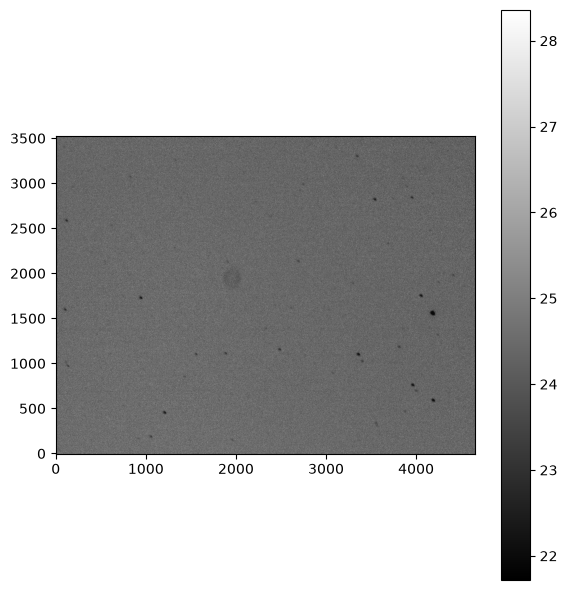

In [93]:
#Display the calibrated science image in magnitudes/square arcsecond
show_image(final_image)


In [94]:
x_neb = 1950
y_neb = 1950
r_neb = 100

y, x = np.indices(ref_image.shape)

nebula_mask = (
    (x - x_neb)**2 +
    (y - y_neb)**2
    <= r_neb**2
)

print("Center:", (x_neb, y_neb))
print("Radius:", r_neb, "pixels")
print("Pixels inside the region:", np.sum(nebula_mask))


Center: (1950, 1950)
Radius: 100 pixels
Pixels inside the region: 31417


In [95]:
# Statistics of the region around the estimated position of M57

x0 = 1950
y0 = 1950
size = 200

region = ref_image[
    y0-size:y0+size,
    x0-size:x0+size
]

print("Analyzed region:")
print("x =", x0-size, "to", x0+size)
print("y =", y0-size, "to", y0+size)

print("\nStatistics:")
print("minimum :", np.nanmin(region))
print("median  :", np.nanmedian(region))
print("mean    :", np.nanmean(region))
print("maximum :", np.nanmax(region))


Analyzed region:
x = 1750 to 2150
y = 1750 to 2150

Statistics:
minimum : -1085.875
median  : 31.09852778961029
mean    : 41.53477472662755
maximum : 1936.3333333333333


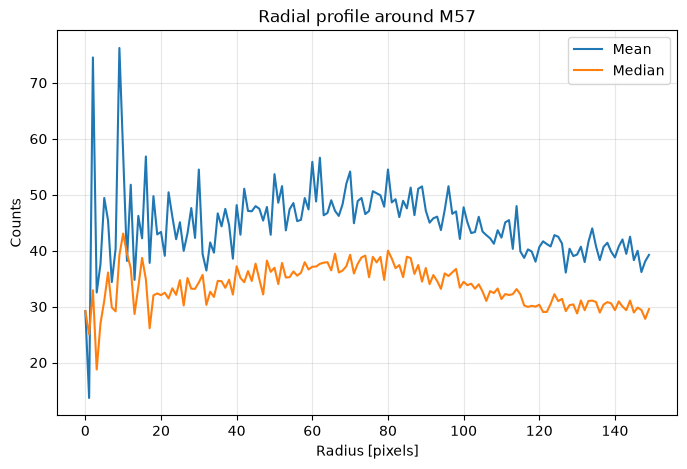

In [96]:
# Radial profile around the estimated position of M57

x_neb = 1950
y_neb = 1950

y, x = np.indices(ref_image.shape)

radius = np.sqrt(
    (x - x_neb)**2 +
    (y - y_neb)**2
)

r_max = 150
radial_r = []
radial_mean = []
radial_median = []

for r in __builtins__.range(0, r_max):
    mask = (radius >= r) & (radius < r + 1)

    values = ref_image[mask]

    radial_r.append(r)
    radial_mean.append(np.nanmean(values))
    radial_median.append(np.nanmedian(values))

plt.figure(figsize=(8, 5))

plt.plot(radial_r, radial_mean, label="Mean")
plt.plot(radial_r, radial_median, label="Median")

plt.xlabel("Radius [pixels]")
plt.ylabel("Counts")
plt.title("Radial profile around M57")
plt.legend()
plt.grid(alpha=0.3)

plt.show()


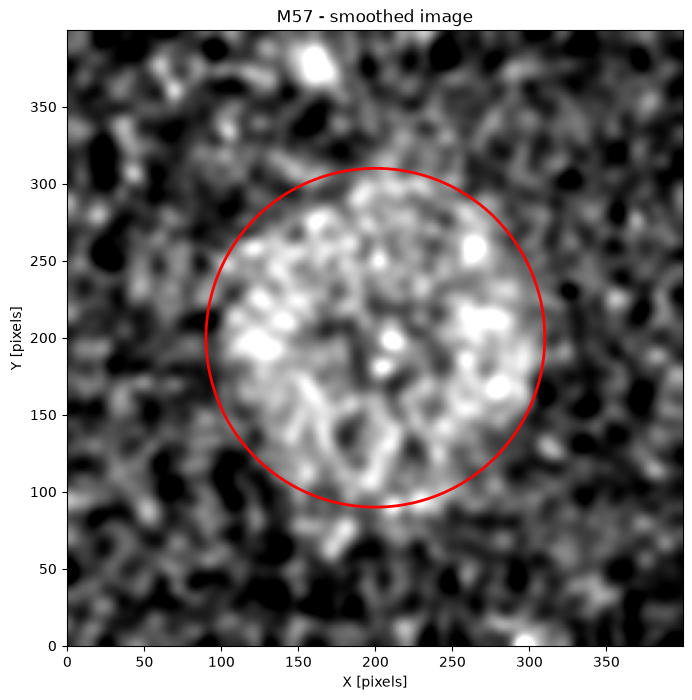

In [97]:
from scipy.ndimage import gaussian_filter

x_neb = 1950
y_neb = 1950
size = 200

region = ref_image[
    y_neb-size:y_neb+size,
    x_neb-size:x_neb+size
]

region_smooth = gaussian_filter(region, sigma=5)

plt.figure(figsize=(8,8))
plt.imshow(
    region_smooth,
    cmap='gray',
    origin='lower',
    vmin=np.nanpercentile(region_smooth, 5),
    vmax=np.nanpercentile(region_smooth, 99)
)

circle = plt.Circle(
    (size, size),
    110,
    fill=False,
    color='red',
    linewidth=2
)

plt.gca().add_patch(circle)
plt.xlabel("X [pixels]")
plt.ylabel("Y [pixels]")
plt.title("M57 - smoothed image")
plt.show()


In [98]:
# Center and radius of M57
x_neb = 1950
y_neb = 1930
r_neb = 110

# Coordinates of all the pixels
y, x = np.indices(ref_image.shape)

# Circular mask of the nebula
nebula_mask = (
    (x - x_neb)**2 +
    (y - y_neb)**2
) <= r_neb**2

# Flux within the aperture
nebula_flux = np.nansum(ref_image[nebula_mask])

print("Number of pixels:", np.sum(nebula_mask))
print("Total flux:", nebula_flux)


Number of pixels: 37981
Total flux: 1771061.992247573


In [99]:
# Local background around M57
r_in_sky = 130
r_out_sky = 180

sky_mask = (
    ((x - x_neb)**2 + (y - y_neb)**2 >= r_in_sky**2) &
    ((x - x_neb)**2 + (y - y_neb)**2 <= r_out_sky**2)
)

sky_values = ref_image[sky_mask]

sky_median = np.nanmedian(sky_values)
sky_sigma = mad_std(sky_values)

print("Background (median):", sky_median)
print("Background sigma:", sky_sigma)


Background (median): 29.91013026785904
Background sigma: 23.624337449191458


In [100]:
# Net flux of M57 after subtracting the background
N_neb = np.sum(nebula_mask)

sky_flux = sky_median * N_neb
nebula_flux_net = nebula_flux - sky_flux

print("Background flux:", sky_flux)
print("Net flux of M57:", nebula_flux_net)

# Integrated magnitude in B
m_nebula_B = -2.5 * np.log10(nebula_flux_net) + C_B

print("Integrated magnitude of M57:", m_nebula_B)


Background flux: 1136016.6577035543
Net flux of M57: 635045.3345440188
Integrated magnitude of M57: 11.349315362958244
